In [104]:
%pip install pandas
%pip install matplotlib
%pip install statsmodels
%pip install seaborn
%pip install scikit-learn
%pip install missingno
%pip install tabulate
#%pip install eli5


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [105]:
import numpy as np  # Importing NumPy for numerical operations
import pandas as pd  # Importing Pandas for data manipulation and analysis
import seaborn as sns  # Importing Seaborn for statistical data visualization
import matplotlib.pylab as plt  # Importing Matplotlib for plotting and visualization
from matplotlib import pyplot  # Importing pyplot for simplified plotting functions
from sklearn import preprocessing  # Importing preprocessing module for data scaling and normalization
import statsmodels.api as sm  # Importing statsmodels for statistical models like OLS regression
from statsmodels.graphics.gofplots import qqplot  # Importing qqplot for Q-Q plots for normality checking
import missingno as msno  # Importing missingno for visualizing missing data patterns

from sklearn import model_selection  # Importing model selection utilities for cross-validation
from sklearn.model_selection import train_test_split  # Importing train_test_split for splitting data into training and test sets
from sklearn.linear_model import LinearRegression  # Importing Linear and Logistic Regression models
from sklearn.model_selection import train_test_split  # Importing train_test_split again (redundant, already imported earlier)
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score  # Importing various metrics for model evaluation
from tabulate import tabulate  # Importing tabulate for pretty-printing tables in the output
from sklearn.metrics import mean_squared_error  # Importing mean_squared_error for evaluating regression model performance

In [106]:
hitters = pd.read_csv("datasets/hitter.csv")
pitchers = pd.read_csv("datasets/pitcher.csv")
teams = pd.read_csv("datasets/teams.csv")



Our goal is find if any performance metrics can explain the salaries of the players. There are 3 files with datasets of hitters, pitchers and teams. We first focus on hitters data and then move on to rest of the dataframes.

##### **We remove missing values from the dataset**
We examine if the dataset has any null values by using `misssingno` library and panda's df.null().

In [107]:
hitters.isnull().sum()

Hitter                      0
NumberAtBat1986             0
NumberHits1986              0
NumberHomeRuns1986          0
NumberRuns1986              0
NumberRunsBat1986           0
NumberWalks1986             0
YearsMajorleag              0
NumberBatCareer             0
NumberHitsCareer            0
NumberHomeRunsCareer        0
NumberRunsCareer            0
NumberRunsBatCareer         0
NumberWalksCareer           0
LeagueEnd1986               0
DivisionEnd1986             0
TeamEnd1986                 0
Position1986                0
PutOuts1986                 0
Assists1986                 0
Errors1986                  0
AnnualSalaryOpenDay1987    59
League1987                  0
Team1987                    0
dtype: int64

<Axes: >

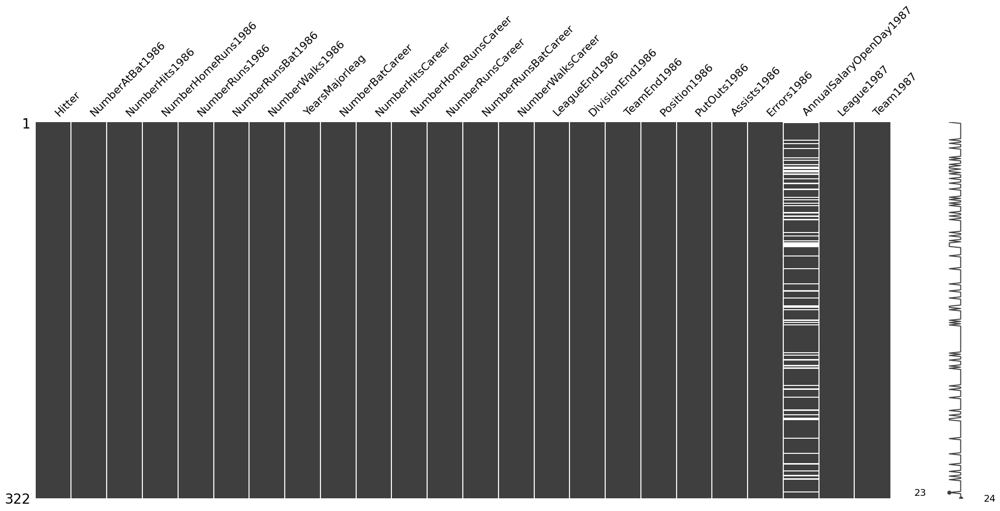

In [108]:
msno.matrix(hitters)

There are 59 null values in the salaries column, so we safely remove these columns as salary is the main component of interest and few columns clearly lack them.

In [109]:
hitters.describe()

,NumberAtBat1986,NumberHits1986,NumberHomeRuns1986,NumberRuns1986,NumberRunsBat1986,NumberWalks1986,YearsMajorleag,NumberBatCareer,NumberHitsCareer,NumberHomeRunsCareer,NumberRunsCareer,NumberRunsBatCareer,NumberWalksCareer,PutOuts1986,Assists1986,Errors1986,AnnualSalaryOpenDay1987
count,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.00000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,263.000000
mean,380.928571,101.024845,10.770186,50.909938,48.027950,38.742236,7.444099,2648.68323,717.571429,69.490683,358.795031,330.118012,260.239130,288.937888,106.913043,8.040373,535.925882
std,153.404981,46.454741,8.709037,26.024095,26.166895,21.639327,4.926087,2324.20587,654.472627,86.266061,334.105886,333.219617,267.058085,280.704614,136.854876,6.368359,451.118681
min,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.00000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67.500000
25%,255.250000,64.000000,4.000000,30.250000,28.000000,22.000000,4.000000,816.75000,209.000000,14.000000,100.250000,88.750000,67.250000,109.250000,7.000000,3.000000,190.000000
50%,379.500000,96.000000,8.000000,48.000000,44.000000,35.000000,6.000000,1928.00000,508.000000,37.500000,247.000000,220.500000,170.500000,212.000000,39.500000,6.000000,425.000000
75%,512.000000,137.000000,16.000000,69.000000,64.750000,53.000000,11.000000,3924.25000,1059.250000,90.000000,526.250000,426.250000,339.250000,325.000000,166.000000,11.000000,750.000000
max,687.000000,238.000000,40.000000,130.000000,121.000000,105.000000,24.000000,14053.00000,4256.000000,548.000000,2165.000000,1659.000000,1566.000000,1378.000000,492.000000,32.000000,2460.000000


In [110]:
pitchers.describe()

,NumberWins1986,NumberLoss1986,EarnedRunAvg1986,NumberGames1986,NumberInningsPitched1986,NumberSaves1986,NumberYearsMajorLeague,NumberWinsCareer,NumberLossCareer,EarnedRunAvgCareer,NumberGamesCareer,NumberInningsPitchedCareer,NumberSavesCareer,AnnualSalaryOpenDay1987
count,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,176.000000
mean,8.781553,8.233010,3.875922,39.660194,145.184466,4.378641,6.412621,53.606796,47.621359,3.700291,213.150485,887.236893,20.830097,497.535250
std,4.557048,3.688357,0.940507,15.527193,62.469395,8.261715,4.668487,58.850996,47.773779,0.637874,181.208280,951.922261,42.461061,371.974464
min,0.000000,0.000000,1.410000,1.000000,4.000000,0.000000,1.000000,1.000000,1.000000,2.230000,4.000000,19.000000,0.000000,62.500000
25%,5.000000,5.000000,3.225000,30.000000,92.375000,0.000000,3.000000,16.000000,14.000000,3.275000,80.250000,263.250000,0.000000,158.750000
50%,9.000000,8.000000,3.835000,35.000000,138.600000,0.000000,5.000000,35.500000,31.500000,3.675000,154.500000,548.000000,3.000000,417.500000
75%,11.000000,11.000000,4.537500,50.000000,198.175000,5.000000,9.000000,64.500000,64.750000,4.082500,298.750000,1174.250000,15.750000,756.250000
max,24.000000,18.000000,8.590000,83.000000,275.100000,46.000000,23.000000,323.000000,261.000000,5.480000,853.000000,5264.200000,278.000000,1850.000000


In [111]:
# Transform the columns with categroical data like teamnames, leaugues and division indexes we know
TEAM_NAME_MAPPINGS = {
  "N.Y.":"New York",
"Phi.":"Philadelphia",
"St.L.":"St. Louis",
"Mon.":"Montreal",
"Chi.":"Chicago",
"Pit.":"Pittsburgh",
"Hou.":"Houston",
"Cin.":"Cincinnati",
"S.F.":"San Francisco",
"S.D.":"San Diego",
"L.A.":"Los Angeles",
"Atl.":"Atlanta",
"Bos.":"Boston",
"Det.":"Detroit",
"Tor.":"Toronto",
"Cle.":"Cleveland",
"Mil.":"Milwaukee",
"Bal.":"Baltimore",
"Cal.":"California",
"Tex.":"Texas",
"K.C.":"Kansas City",
"Oak.":"Oakland",
"Min.":"Minnesota",
"Sea.":"Seattle",
}
TEAM_NAME_INDEXES = (
  "N.Y.",
"Phi.",
"St.L.",
"Mon.",
"Chi.",
"Pit.",
"Hou.",
"Cin.",
"S.F.",
"S.D.",
"L.A.",
"Atl.",
"Bos.",
"Det.",
"Tor.",
"Cle.",
"Mil.",
"Bal.",
"Cal.",
"Tex.",
"K.C.",
"Oak.",
"Min.",
"Sea.",
)
LEAGUE_MAPPINGS = {"N":"National","A":"American"}
LEAGUE_INDEXES = ("N", "A")
DIVISION_MAPPINGS = {"W":"WEST","E":"EAST"}
DIVISION_INDEXES = ("W", "E")
PLAYER_POSITION_MAPPINGS = {
  "1B":   "First Base",
     "2B":   "Second Base",
     "SS":   "Short Stop",
     "3B":   "Third Base",
     "RF":  "Right Field",
     "CF":   "Center Field",
     "LF":   "Left Field",
     "C":    "Catcher",
     "DH":   "Designated Hitter",
     "OF":   "Outfield",
     "UT":   "Utility",
     "OS":   "Outfield and Short Stop",
     "3S":   "Third Base and Short Stop",
     "13":   "First and Third Base",
     "3O":   "Third Base and Outfield",
     "O1":   "Outfield and First Base",
     "S3":   "Short Stop and Third Base",
     "32":   "Third and Second Base",
     "DO":   "Designated Hitter and Outfield",
     "OD":   "Outfield and Designated Hitter",
     "CD":   "Catcher and Designated Hitter",
     "CS":   "Catcher and Short Stop",
     "23":   "Second and Third Base",
     "1O":   "First Base and Outfield",
     "2S":  "Second Base and Short Stop",
}
PLAYER_POSITION_INDEXES = tuple(PLAYER_POSITION_MAPPINGS.keys())

hitters.head()


,Hitter,NumberAtBat1986,NumberHits1986,NumberHomeRuns1986,NumberRuns1986,NumberRunsBat1986,NumberWalks1986,YearsMajorleag,NumberBatCareer,NumberHitsCareer,...,LeagueEnd1986,DivisionEnd1986,TeamEnd1986,Position1986,PutOuts1986,Assists1986,Errors1986,AnnualSalaryOpenDay1987,League1987,Team1987
0,Andy Allanson,293,66,1,30,29,14,1,293,66,...,A,E,Cle.,C,446,33,20,NaN,A,Cle.
1,Alan Ashby,315,81,7,24,38,39,14,3449,835,...,N,W,Hou.,C,632,43,10,475.0,N,Hou.
2,Alvin Davis,479,130,18,66,72,76,3,1624,457,...,A,W,Sea.,1B,880,82,14,480.0,A,Sea.
3,Andre Dawson,496,141,20,65,78,37,11,5628,1575,...,N,E,Mon.,RF,200,11,3,500.0,N,Chi.
4,Andres Galarraga,321,87,10,39,42,30,2,396,101,...,N,E,Mon.,1B,805,40,4,91.5,N,Mon.


In [112]:
def transform_labels(map):
  def mapper(val):
    return map.index(val)+1
  return mapper
hitters["LeagueEnd1986Labels"] = hitters["LeagueEnd1986"].transform(transform_labels(LEAGUE_INDEXES))
hitters["DivisionEnd1986Labels"] = hitters["DivisionEnd1986"].transform(transform_labels(DIVISION_INDEXES))
hitters["TeamEnd1986Labels"] = hitters["TeamEnd1986"].transform(transform_labels(TEAM_NAME_INDEXES))
hitters["Position1986Labels"] = hitters["Position1986"].transform(transform_labels(PLAYER_POSITION_INDEXES))
hitters["League1987Labels"] = hitters["League1987"].transform(transform_labels(LEAGUE_INDEXES))
hitters["Team1987Labels"] = hitters["Team1987"].transform(transform_labels(TEAM_NAME_INDEXES))
hitters.head()

,Hitter,NumberAtBat1986,NumberHits1986,NumberHomeRuns1986,NumberRuns1986,NumberRunsBat1986,NumberWalks1986,YearsMajorleag,NumberBatCareer,NumberHitsCareer,...,Errors1986,AnnualSalaryOpenDay1987,League1987,Team1987,LeagueEnd1986Labels,DivisionEnd1986Labels,TeamEnd1986Labels,Position1986Labels,League1987Labels,Team1987Labels
0,Andy Allanson,293,66,1,30,29,14,1,293,66,...,20,NaN,A,Cle.,2,2,16,8,2,16
1,Alan Ashby,315,81,7,24,38,39,14,3449,835,...,10,475.0,N,Hou.,1,1,7,8,1,7
2,Alvin Davis,479,130,18,66,72,76,3,1624,457,...,14,480.0,A,Sea.,2,1,24,1,2,24
3,Andre Dawson,496,141,20,65,78,37,11,5628,1575,...,3,500.0,N,Chi.,1,2,4,5,1,5
4,Andres Galarraga,321,87,10,39,42,30,2,396,101,...,4,91.5,N,Mon.,1,2,4,1,1,4


In [113]:
hitters.isnull().sum()

Hitter                      0
NumberAtBat1986             0
NumberHits1986              0
NumberHomeRuns1986          0
NumberRuns1986              0
NumberRunsBat1986           0
NumberWalks1986             0
YearsMajorleag              0
NumberBatCareer             0
NumberHitsCareer            0
NumberHomeRunsCareer        0
NumberRunsCareer            0
NumberRunsBatCareer         0
NumberWalksCareer           0
LeagueEnd1986               0
DivisionEnd1986             0
TeamEnd1986                 0
Position1986                0
PutOuts1986                 0
Assists1986                 0
Errors1986                  0
AnnualSalaryOpenDay1987    59
League1987                  0
Team1987                    0
LeagueEnd1986Labels         0
DivisionEnd1986Labels       0
TeamEnd1986Labels           0
Position1986Labels          0
League1987Labels            0
Team1987Labels              0
dtype: int64

In [114]:
hitters_copy = hitters.dropna()
hitters_copy.isnull().sum()
hitters_copy.shape

(263, 30)

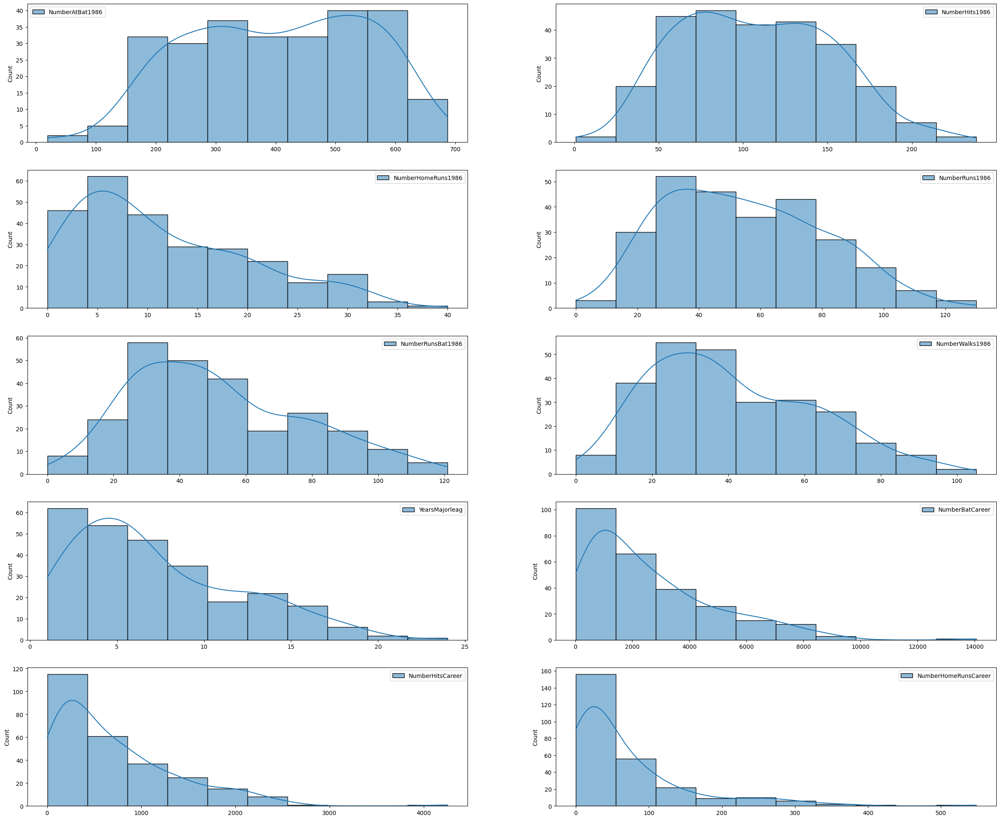

In [115]:
#numerical_ft = [["NumberAtBat1986"],['NumberHits1986'],['NumberHomeRuns1986'],['NumberRuns1986'],['NumberRunsBat1986'],['NumberWalks1986'],['YearsMajorleag'],['NumberBatCareer'],['NumberHitsCareer'],['NumberHomeRunsCareer'],['NumberRunsCareer'],['NumberRunsBatCareer'],['NumberWalksCareer'],['LeagueEnd1986Labels'],['DivisionEnd1986Labels'],['TeamEnd1986Labels'],['Position1986Labels'],['PutOuts1986'],['Assists1986'],['Errors1986'],['AnnualSalaryOpenDay1987'],['League1987Labels'],['Team1987Labels']]
numerical_ft_1 = [
    ["NumberAtBat1986"],['NumberHits1986'],['NumberHomeRuns1986'],['NumberRuns1986'],['NumberRunsBat1986'],['NumberWalks1986'],['YearsMajorleag'],['NumberBatCareer'],['NumberHitsCareer'],['NumberHomeRunsCareer'],
]
numerical_ft_2 = [
    ['NumberRunsCareer'],['NumberRunsBatCareer'],['NumberWalksCareer'],['PutOuts1986'],['Assists1986'],['Errors1986'],['AnnualSalaryOpenDay1987'],
]
numerical_ft_3 = [
    ['LeagueEnd1986Labels'],['DivisionEnd1986Labels'],['TeamEnd1986Labels'],['Position1986Labels'],['League1987Labels'],['Team1987Labels']
]

plt.figure(figsize=(30,25))
for i,col in enumerate(numerical_ft_1,1):
    plt.subplot(5,2,i)
    sns.histplot(hitters_copy[col],kde=True,bins = 10)

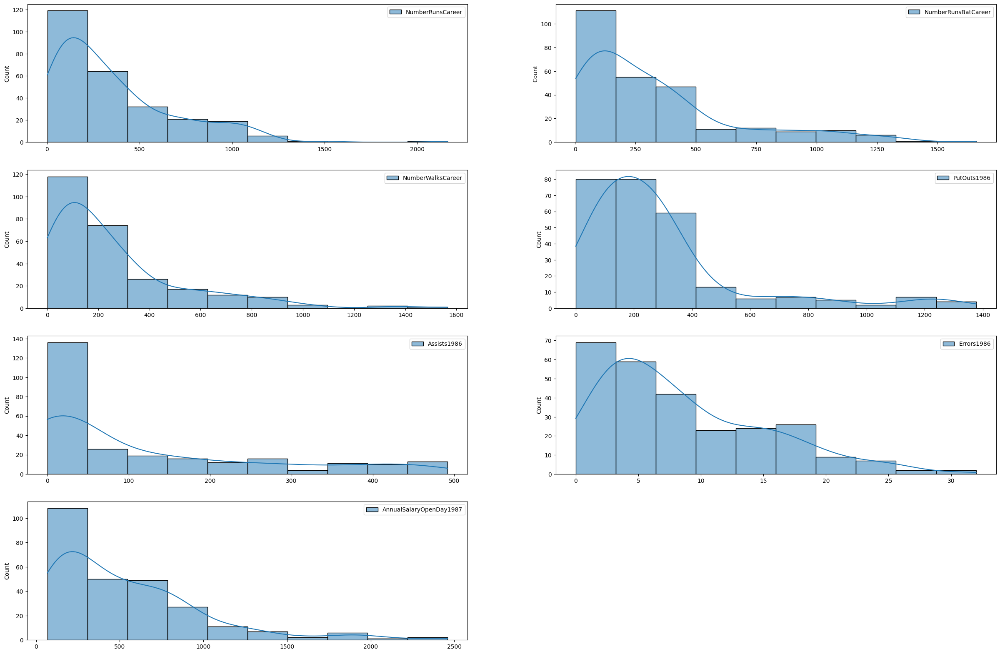

In [116]:
plt.figure(figsize=(30,25))
for i,col in enumerate(numerical_ft_2,1):
    plt.subplot(5,2,i)
    sns.histplot(hitters_copy[col],kde=True,bins = 10)

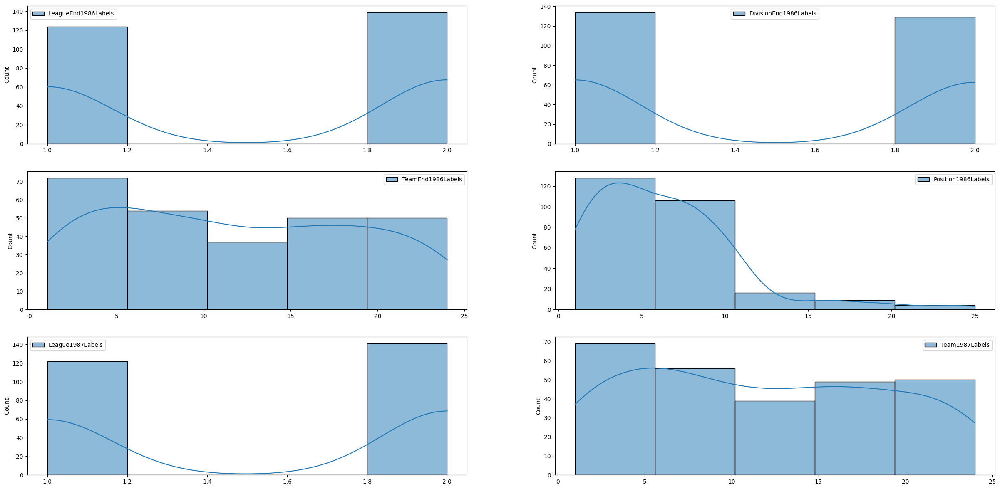

In [117]:
plt.figure(figsize=(30,25))
for i,col in enumerate(numerical_ft_3,1):
    plt.subplot(5,2,i)
    sns.histplot(hitters_copy[col],kde=True,bins = 5)

We observe that the salaries are right sqewed explaining that there are few high paid players and presense of strong outliers.
This pattern is also observed in overall career performance variables. So we shall remove the potential outliers. We choose the IQR method as mean is affected by outliers.

We observe most of career metric are sqewed to the right this is expected so we go about applying log transform on the careeer metrics so that it is normally distributed

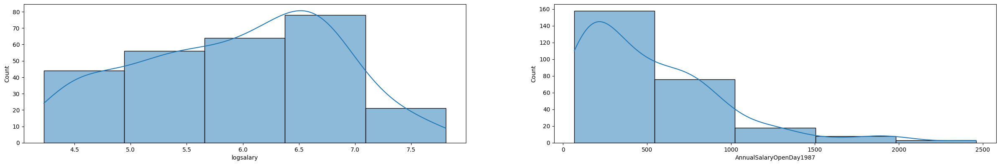

In [118]:


hitters_copy = hitters_copy.assign(C=lambda row: (10*row["Errors1986"])/(row["PutOuts1986"]-row["Assists1986"]-0.1))
q1 = hitters_copy['AnnualSalaryOpenDay1987'].quantile(0.25)
q3 = hitters_copy['AnnualSalaryOpenDay1987'].quantile(0.75)
iqr = q3 - q1

performance_columns_1986 = [
    "NumberAtBat1986",'NumberHits1986', 'NumberHomeRuns1986', 'NumberRuns1986', 'NumberRunsBat1986', 'NumberWalks1986', 'PutOuts1986', 'Assists1986', 'Errors1986',
]
career_performance_columns_1986 = [
    'YearsMajorleag', 'NumberBatCareer', 'NumberHitsCareer', 'NumberHomeRunsCareer', 'NumberRunsCareer', 'NumberRunsBatCareer', 'NumberWalksCareer',
]
non_performance_columns = [
    'LeagueEnd1986Labels', 'DivisionEnd1986Labels', 'TeamEnd1986Labels', 'Position1986Labels', 'League1987Labels', 'Team1987Labels', 
]
target_column = ['AnnualSalaryOpenDay1987']

hitters_copy["logsalary"] = np.log(hitters_copy['AnnualSalaryOpenDay1987']+1)
for col in career_performance_columns_1986:
  hitters_copy["Log"+col] = np.log(hitters_copy[col]+1)
for col in performance_columns_1986:
  hitters_copy["Log"+col] = np.log(hitters_copy[col]+1)

performance_columns_1986 = [
    "NumberAtBat1986",'NumberHits1986', 'NumberHomeRuns1986', 'NumberRuns1986', 'NumberRunsBat1986', 'NumberWalks1986', 'LogPutOuts1986', 'LogAssists1986', 'LogErrors1986',
]
career_performance_columns_1986 = [
    'LogYearsMajorleag', 'LogNumberBatCareer', 'LogNumberHitsCareer', 'LogNumberHomeRunsCareer', 'LogNumberRunsCareer', 'LogNumberRunsBatCareer', 'LogNumberWalksCareer',
]



plt.figure(figsize=(30,25))
for i,col in enumerate(["logsalary", "AnnualSalaryOpenDay1987"],1):
    plt.subplot(5,2,i)
    sns.histplot(hitters_copy[col],kde=True,bins = 5)

# sns.boxplot(data=hitters_copy[performance_columns_1986 + career_performance_columns_1986])

# sns.boxplot(x='Assists1986',data =hitters_copy, ax=axarr[3][1])
# sns.boxplot(x='Errors1986',data =hitters_copy, ax=axarr[4][0])
# sns.boxplot(x='PutOuts1986',data =hitters_copy, ax=axarr[4][1])
#hitters_copy["2*errors/(putout-assist)"] = hitters_copy.apply(calculate_new_value, axis=1)


<Axes: >

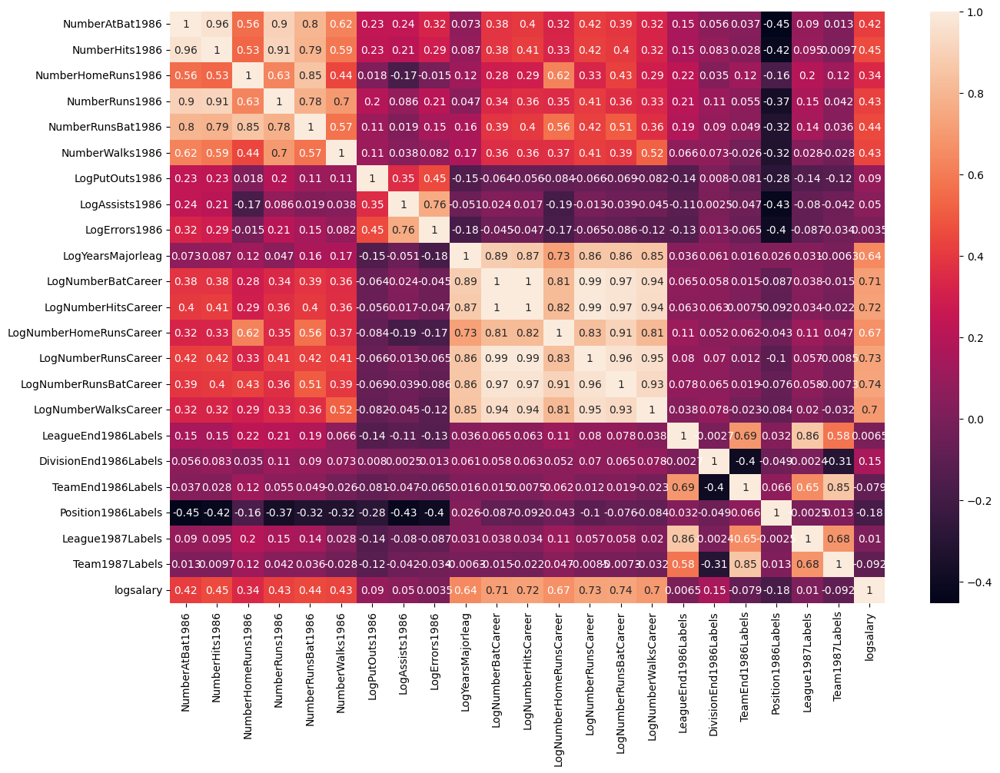

In [119]:
plt.figure(figsize=(15,10))

sns.heatmap(hitters_copy[[*performance_columns_1986, *career_performance_columns_1986, *non_performance_columns, "logsalary"]].corr(),annot = True)

The correlation matrix has the first few features which are performance in 1986, then overall career performance and finally the external factors like team. We are interested in the first overall performance and 1986 perfromance, against salary.
Correlations: 
Highest Positive correlation is with overall career performance metrics
High correlation also exists between the performance in 1986 with highest among them explained by Number of runs batted

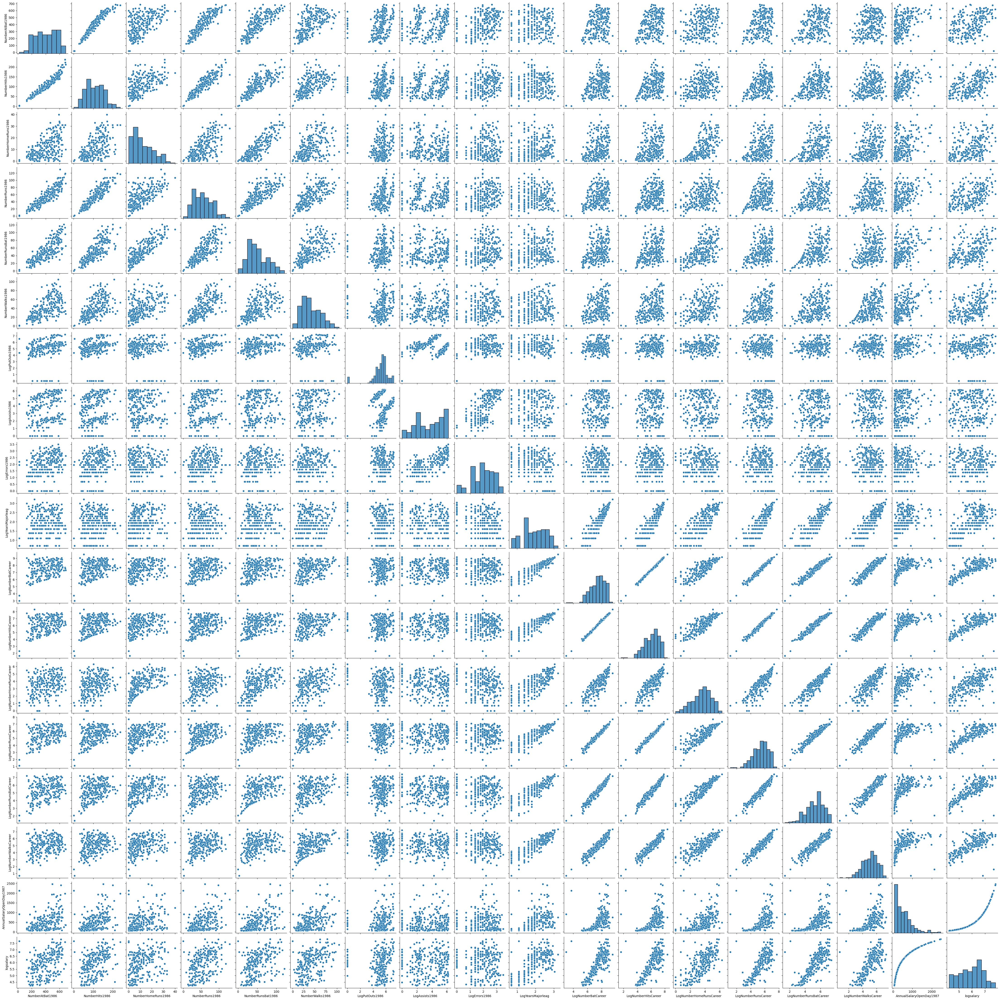

In [120]:
target_column = ['logsalary']

#  To understand relationship between variables
sns.pairplot(hitters_copy[[*performance_columns_1986, *career_performance_columns_1986, "AnnualSalaryOpenDay1987" , *target_column]])


We see the distribution of annual salary is right sqewed we can ignore few values by this is expected that there are few top paid, so instead we apply log transformation and see.
So the boxplot for the log values show that the distribution is good and also there is better correlation values in heatmap. So we go ahead with log values.
(LogNumberBatCareer, LogNumberHitsCareer)(corr 1), LogNumberRunsCareer, LogNumberRunsBatCareer, LogNumber Walks Career
NumberHits1986, NumberRunsBat1986, NumberAtBat1986
These are top correlated so we try to analyze by visualization besides charts side by side.

In [121]:
top_n = int(len(hitters_copy) * 0.1)

top_10_percent = hitters_copy.nlargest(top_n, ['AnnualSalaryOpenDay1987']) 

# Most values have count > 10 below
# vc = hitters_copy["AnnualSalaryOpenDay1987"].value_counts()
# vc[vc <= 1].value_counts()

<Axes: xlabel='Team1987Labels', ylabel='count'>

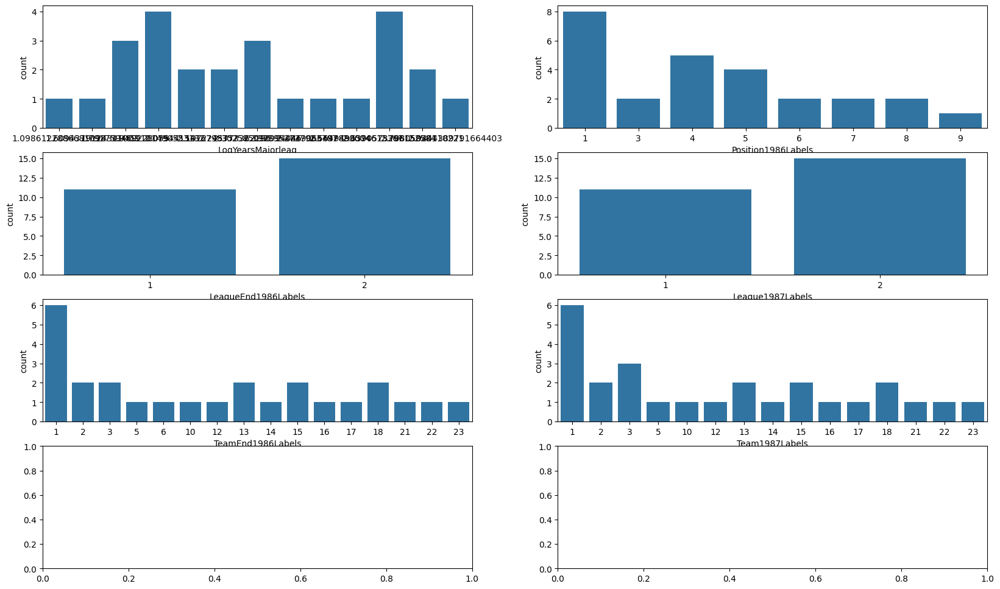

In [122]:
fig, axarr = plt.subplots(4, 2, figsize=(20, 12))

# Plot a count plot of 'country' vs. 'churn' with 'churn' as hue, showing distribution for each country
# (NumberBatCareer, NumberHitsCareer)(corr 1), NumberRunsCareer, NumberRunsBatCareer, Number Walks Career
# NumberHits1986, NumberRunsBat1986, NumberAtBat1986
['YearsMajorleag', 'LeagueEnd1986Labels', 'DivisionEnd1986Labels', 'TeamEnd1986Labels', 'Position1986Labels', 'League1987Labels', 'Team1987Labels']
sns.countplot(x='LogYearsMajorleag', data=top_10_percent, ax=axarr[0][0])
sns.countplot(x='Position1986Labels', data=top_10_percent, ax=axarr[0][1])
sns.countplot(x='LeagueEnd1986Labels', data=top_10_percent, ax=axarr[1][0])
sns.countplot(x='League1987Labels', data=top_10_percent, ax=axarr[1][1])
sns.countplot(x='TeamEnd1986Labels', data=top_10_percent, ax=axarr[2][0])
sns.countplot(x='Team1987Labels', data=top_10_percent, ax=axarr[2][1])

# Above shows that 1 person moved from team 6 to team 3



In logsalary we see value from 4 to 8 so we can make 4 categories of salary pay
4-5- Low
5-6 - Medium
6-7 - High
7-8 - Top Paid

In [123]:
def sal_cat(x):
  if x < 5:
    return "Low"
  elif 5 <= x < 6:
    return "Medium"
  elif 6 <= x < 7:
    return "High"
  else:
    return "Top"

hitters_copy["Salary category"] = hitters_copy["logsalary"].transform(sal_cat)


<Axes: xlabel='Team1987Labels', ylabel='count'>

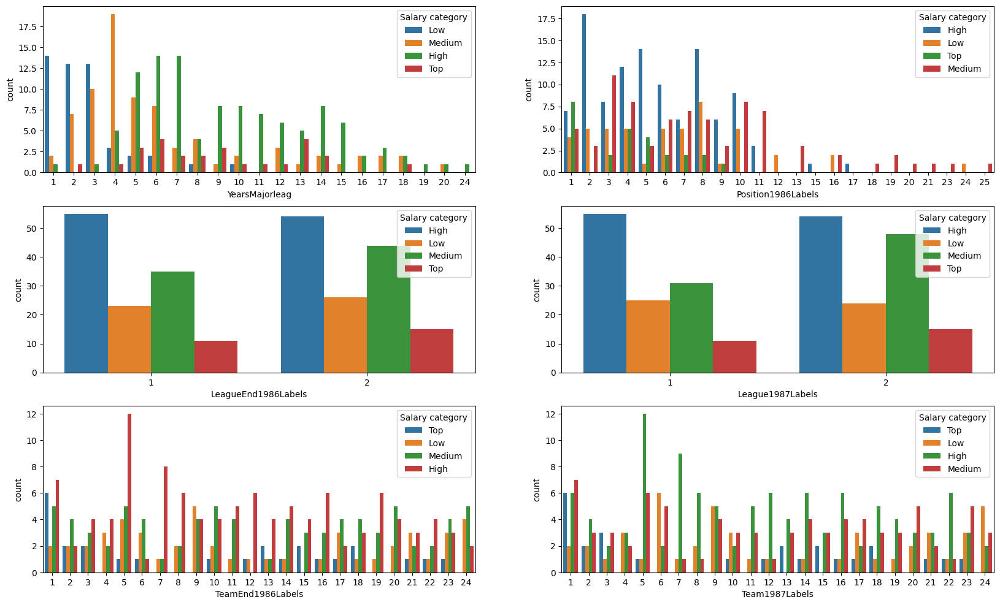

In [124]:
fig, axarr = plt.subplots(3, 2, figsize=(20, 12))

# Plot a count plot of 'country' vs. 'churn' with 'churn' as hue, showing distribution for each country
# (NumberBatCareer, NumberHitsCareer)(corr 1), NumberRunsCareer, NumberRunsBatCareer, Number Walks Career
# NumberHits1986, NumberRunsBat1986, NumberAtBat1986
['LogYearsMajorleag', 'LeagueEnd1986Labels', 'DivisionEnd1986Labels', 'TeamEnd1986Labels', 'Position1986Labels', 'League1987Labels', 'Team1987Labels']
sns.countplot(x='YearsMajorleag', hue="Salary category", data=hitters_copy, ax=axarr[0][0])
sns.countplot(x='Position1986Labels', hue="Salary category", data=hitters_copy, ax=axarr[0][1])
sns.countplot(x='LeagueEnd1986Labels', hue="Salary category", data=hitters_copy, ax=axarr[1][0])
sns.countplot(x='League1987Labels', hue="Salary category", data=hitters_copy, ax=axarr[1][1])
sns.countplot(x='TeamEnd1986Labels',hue="Salary category", data=hitters_copy, ax=axarr[2][0])
sns.countplot(x='Team1987Labels',hue="Salary category", data=hitters_copy, ax=axarr[2][1])




In [125]:
top_10_percent_runs_career = hitters_copy.nlargest(top_n, ['NumberHits1986']) 
top_10_percent_runs_1986 = hitters_copy.nlargest(top_n, ['LogNumberHitsCareer']) 

<Axes: xlabel='Team1987Labels', ylabel='count'>

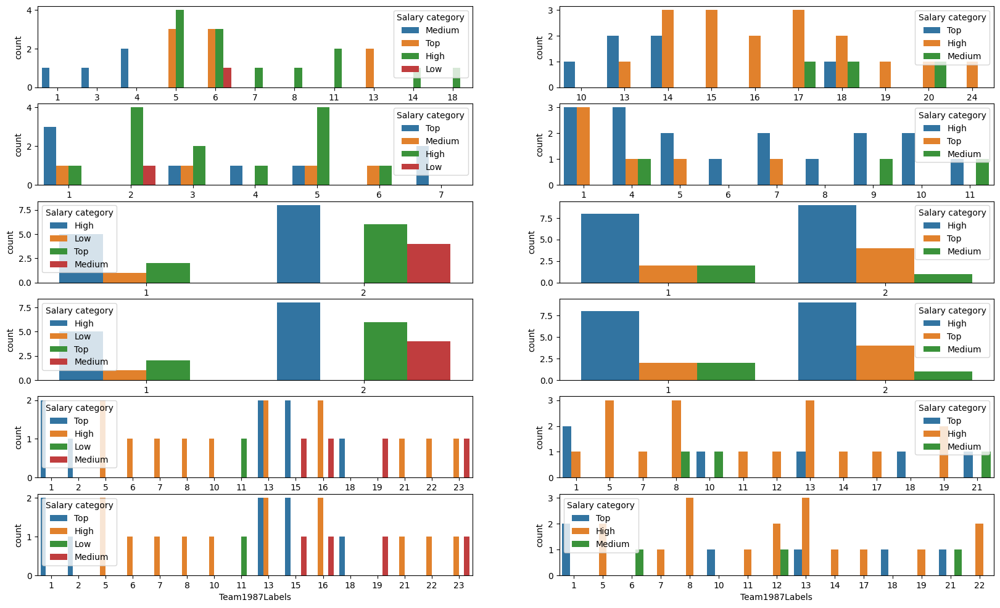

In [126]:
fig, axarr = plt.subplots(6, 2, figsize=(20, 12))
sns.countplot(x='YearsMajorleag', hue="Salary category", data=top_10_percent_runs_career, ax=axarr[0][0])
sns.countplot(x='YearsMajorleag', hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[0][1])
sns.countplot(x='Position1986Labels', hue="Salary category", data=top_10_percent_runs_career, ax=axarr[1][0])
sns.countplot(x='Position1986Labels', hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[1][1])
sns.countplot(x='LeagueEnd1986Labels', hue="Salary category", data=top_10_percent_runs_career, ax=axarr[2][0])
sns.countplot(x='LeagueEnd1986Labels', hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[2][1])
sns.countplot(x='League1987Labels', hue="Salary category", data=top_10_percent_runs_career, ax=axarr[3][0])
sns.countplot(x='League1987Labels', hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[3][1])
sns.countplot(x='TeamEnd1986Labels',hue="Salary category", data=top_10_percent_runs_career, ax=axarr[4][0])
sns.countplot(x='TeamEnd1986Labels',hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[4][1])
sns.countplot(x='Team1987Labels',hue="Salary category", data=top_10_percent_runs_career, ax=axarr[5][0])
sns.countplot(x='Team1987Labels',hue="Salary category", data=top_10_percent_runs_1986, ax=axarr[5][1])


LogNumberBatCareer4.618 +/- 0.700
LogNumberRunsCareer1.656 +/- 0.259
LogNumberHitsCareer1.266 +/- 0.213
LogNumberRunsBatCareer0.641 +/- 0.133
LogNumberWalksCareer0.071 +/- 0.033
NumberAtBat19860.045 +/- 0.020


Last two boxes show that there is a shift in players for top 10% of the runs scored in previous season, We see first that low paid players are not in top 10% of runs scorers and secondly we see that there is a team shift for the top 10% hitters based on last season rather than thier career. We have enough data we shall go build prediction model.

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_9869/1345195123.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[cols] = scaler.fit_transform(X)


                            OLS Regression Results                            
Dep. Variable:              logsalary   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     78.08
Date:                Fri, 06 Dec 2024   Prob (F-statistic):           1.45e-49
Time:                        19:58:02   Log-Likelihood:                -251.69
No. Observations:                 263   AIC:                             515.4
Df Residuals:                     257   BIC:                             536.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
NumberAtBat1986           -0

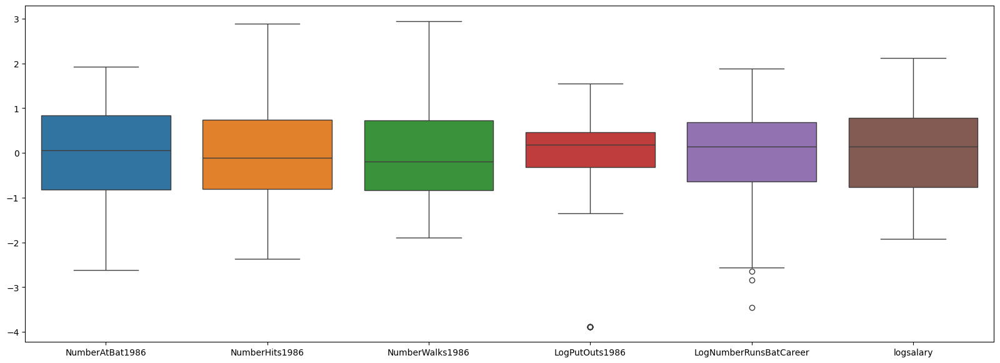

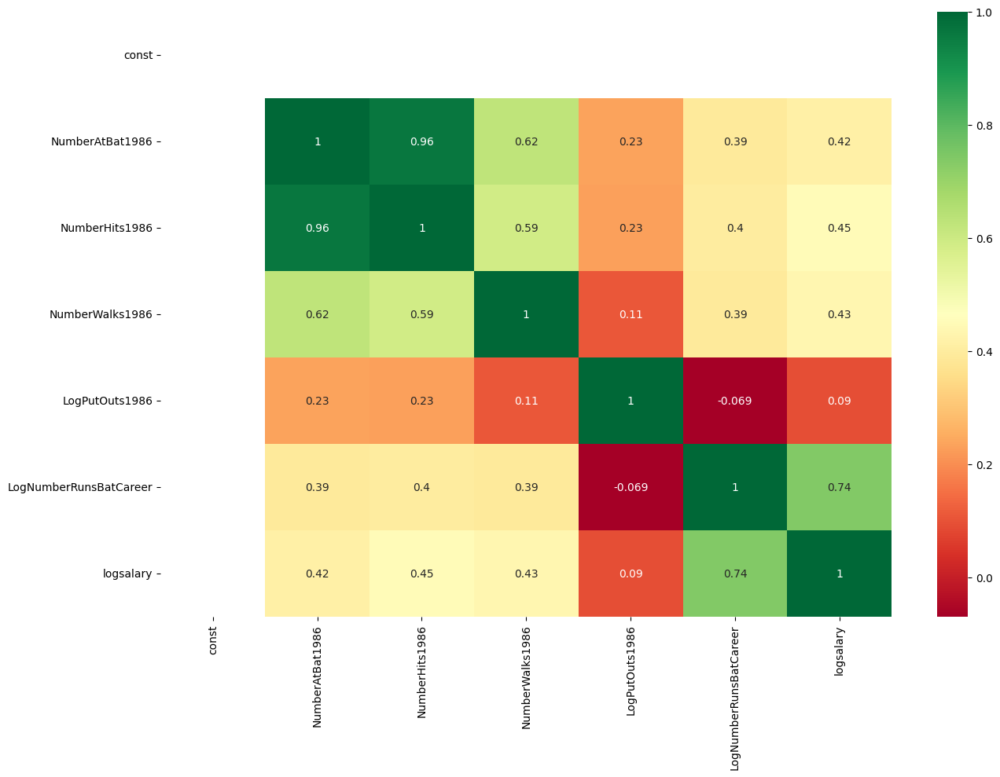

In [358]:
from sklearn.preprocessing import StandardScaler



scaler = StandardScaler()


cols = performance_columns_1986+career_performance_columns_1986+target_column
cols.remove("LogYearsMajorleag")
# cols.remove("LogNumberRunsCareer")
cols.remove("LogErrors1986")
cols.remove("LogAssists1986")
# cols.remove('LogPutOuts1986')
cols.remove("LogNumberHomeRunsCareer")
cols.remove("NumberHomeRuns1986")
cols.remove("NumberRuns1986")
cols.remove("LogNumberHitsCareer")
cols.remove("LogNumberWalksCareer")
cols.remove("NumberRunsBat1986")
cols.remove("LogNumberBatCareer")
cols.remove("LogNumberRunsCareer")

final_df = hitters_copy[cols]
# final_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values (which replaced infinities)
# final_df = final_df.dropna()

# final_df.isin([np.inf, -np.inf]).sum().sum()




X = final_df
X[cols] = scaler.fit_transform(X)
X = sm.add_constant(X)




plt.figure(figsize=(20,7))
sns.boxplot(data = X[cols])
cols.remove("logsalary")

plt.figure(figsize=(15,10))
sns.heatmap(X.corr(),annot = True,cmap="RdYlGn")


model = sm.OLS(X["logsalary"], X[cols+["const"]])
results = model.fit()
print(results.summary())

In [359]:
from sklearn.inspection import permutation_importance
print(cols)
X_t, X_test, y_t, y_test = train_test_split(hitters_copy[cols], hitters_copy[target_column[0]], test_size=0.20, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.20, random_state=1)
# Create linear regression object
model = LinearRegression()
model.fit(X_train,y_train)
r = permutation_importance(model, X_test, y_test,
                           n_repeats=30,
                           random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{cols[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

['NumberAtBat1986', 'NumberHits1986', 'NumberWalks1986', 'LogPutOuts1986', 'LogNumberRunsBatCareer']
LogNumberRunsBatCareer0.815 +/- 0.155
NumberAtBat19860.300 +/- 0.064
NumberHits19860.282 +/- 0.079


In [ ]:
# signifanct_cols = ["NumberWalks1986","NumberAtBat1986", "NumberHits1986", "LogNumberRunsBatCareer", "LogPutOuts1986"]
# signifanct_cols = ["LogNumberRunsBatCareer", "NumberHits1986", "NumberAtBat1986"]

'''
NumberAtBat1986           -0.4534      0.154     -2.948      0.003      -0.756      -0.151
NumberHits1986             0.5127      0.149      3.439      0.001       0.219       0.806
NumberWalks1986            0.1420      0.052      2.750      0.006       0.040       0.244
LogPutOuts1986             0.1080      0.041      2.627      0.009       0.027       0.189
LogNumberRunsBatCareer     0.6627      0.045     14.845      0.000       0.575       0.751
const    
'''

signifanct_cols = ["LogNumberRunsBatCareer", "NumberAtBat1986", "NumberHits1986"]
# signifanct_cols = ["LogNumberRunsBatCareer", "NumberAtBat1986", "NumberHits1986"]
target_column = ["logsalary"]




model = sm.OLS(X[target_column[0]], X[signifanct_cols])
results = model.fit()
print(results.summary())

# Remove log number walks career as it has no significance
# signifanct_cols.remove("LogNumberWalksCareer")

                                 OLS Regression Results                                
Dep. Variable:              logsalary   R-squared (uncentered):                   0.581
Model:                            OLS   Adj. R-squared (uncentered):              0.576
Method:                 Least Squares   F-statistic:                              120.1
Date:                Fri, 06 Dec 2024   Prob (F-statistic):                    7.93e-49
Time:                        20:05:15   Log-Likelihood:                         -258.83
No. Observations:                 263   AIC:                                      523.7
Df Residuals:                     260   BIC:                                      534.4
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

We are concerned about only performance metrics hence we only take performamce releated attributes and Also the number of walks when with selected attributes has less significance so we remove it too.

<Figure size 600x400 with 0 Axes>

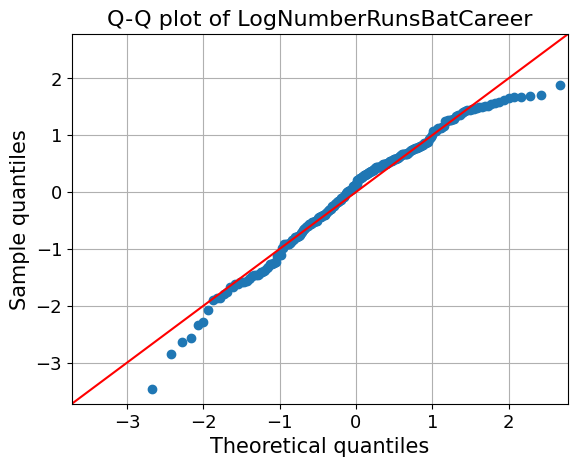

<Figure size 600x400 with 0 Axes>

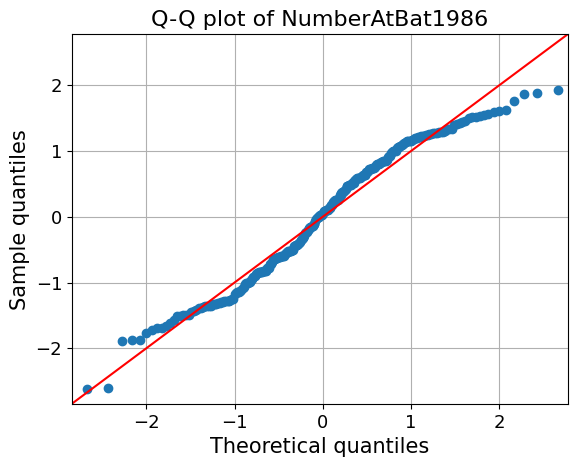

<Figure size 600x400 with 0 Axes>

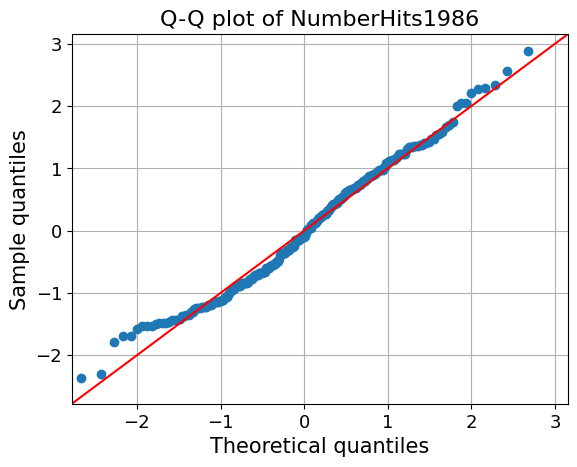

In [385]:
from statsmodels.graphics.gofplots import qqplot
norm_dist_data=X[signifanct_cols]
for c in norm_dist_data.columns[:]:
  plt.figure(figsize=(6,4))
  fig=qqplot(X[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

In [389]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split


X_cols = X[signifanct_cols]
y_cols = X[target_column[0]]

X_train, X_test,y_train, y_test = train_test_split(X_cols,y_cols,train_size=0.8)

print('X_train : ')
print(X_train.head())
print('')
print('X_test : ')
print(X_test.head())
print('')
print('y_train : ')
print(y_train.head())
print('')
print('y_test : ')
print(y_test.head())

X_train : 
     LogNumberRunsBatCareer  NumberAtBat1986  NumberHits1986
172               -0.880316         0.335703       -0.151620
108                0.429947         1.614381        2.002047
126                0.314720        -0.827349       -0.662284
167               -0.328681         0.002431       -0.351445
231               -0.141336         0.832211        1.224951

X_test : 
     LogNumberRunsBatCareer  NumberAtBat1986  NumberHits1986
186               -0.201374        -0.405658       -0.506864
165               -0.646771        -0.602900       -0.706689
59                 0.776405         1.519160        1.535789
260                0.314720         0.628167        0.248029
192                0.693963         0.594159        0.736490

y_train : 
172   -0.738560
108    1.287878
126    0.322852
167   -0.253376
231    0.780671
Name: logsalary, dtype: float64

y_test : 
186   -0.253376
165   -0.996715
59     1.444774
260    0.954796
192    0.377925
Name: logsalary, dtype: float64

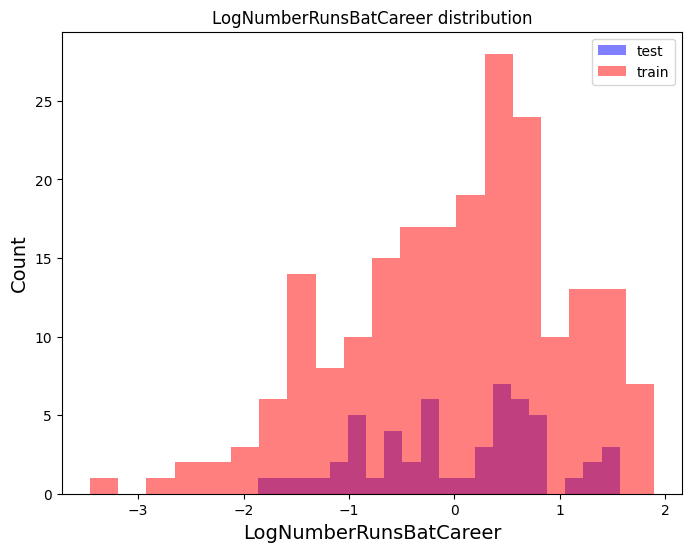

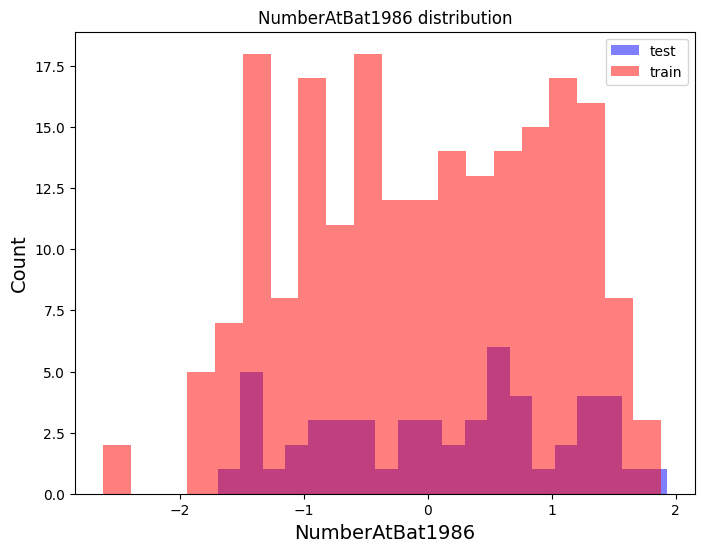

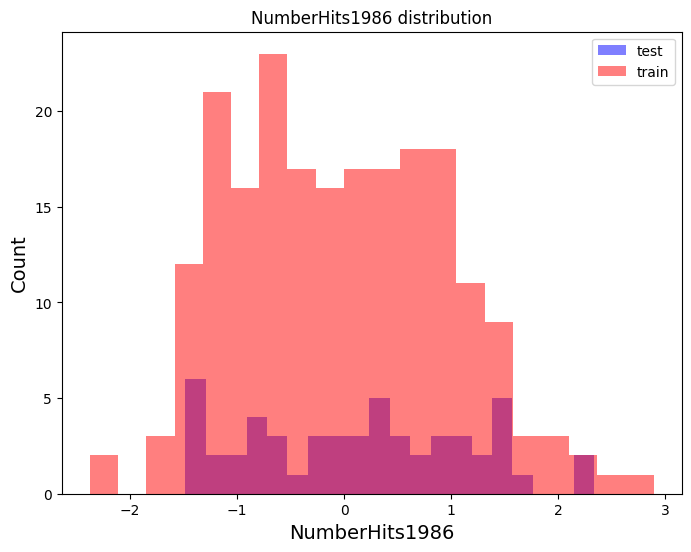

In [390]:
X_test_plot = X_test[signifanct_cols]
X_train_plot = X_train[signifanct_cols]
for col in X_test_plot.columns[:]:
    plt.figure(figsize=(8,6))

    plt.hist(X_test_plot[col], bins=20, alpha=0.5, label="test",color = 'b')
    plt.hist(X_train_plot[col], bins=20, alpha=0.5, label="train",color = 'r')
    plt.xlabel(col, size=14)
    plt.ylabel("Count", size=14)

    plt.legend(loc='upper right')
    plt.title("{} distribution".format(col))
    plt.show()

The intercept b0=  -0.020409387601925538
The coefficient b1=  [ 0.65251561 -0.32608886  0.47536744]
Training Score: 0.5513245320316589
MAE: 0.4123721136699474
MSE: 0.2674832778092269
RMSE: 0.5171878554347801
R2: 0.6978819128486391


Text(0.5, 1.0, 'Histogram of residuals')

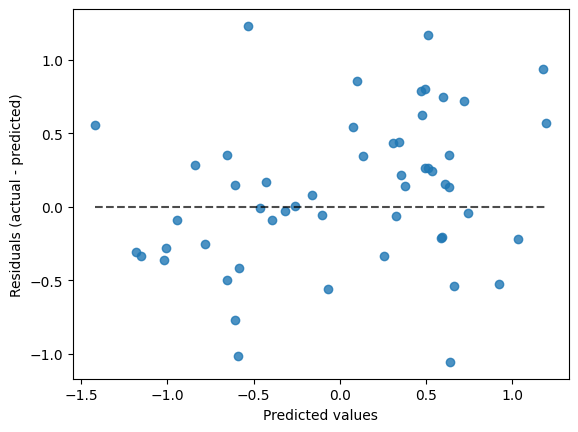

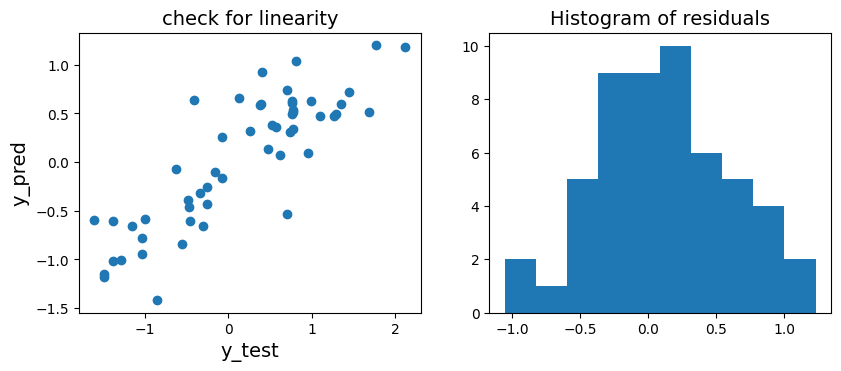

In [391]:
linearModel = LinearRegression()
linearModel.fit(X_train,y_train)





print("The intercept b0= ", linearModel.intercept_)

print("The coefficient b1= ", linearModel.coef_)
print(f"Training Score: {linearModel.score(X_train, y_train)}")
predictions = linearModel.predict(X_test)
from sklearn.metrics import PredictionErrorDisplay
from sklearn.metrics import mean_absolute_error, r2_score

display = PredictionErrorDisplay(y_true=y_test, y_pred=predictions)
display.plot()
# Compute metrics
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = linearModel.score(X_test, y_test)

# Display metrics
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R2: {r2}")

plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.scatter(y_test, predictions)
plt.xlabel('y_test',fontsize=14), plt.ylabel('y_pred',fontsize=14)
plt.title('check for linearity',fontsize=14)
plt.subplot(2,3,2)
plt.hist(y_test - predictions)
plt.title('Histogram of residuals',fontsize=14)



MAE: 0.43440647575939684
MSE: 0.24832397430296776
RMSE: 0.49832115578506975
R2: 0.7819393976220788


Text(0.5, 1.0, 'Q-Q plot')

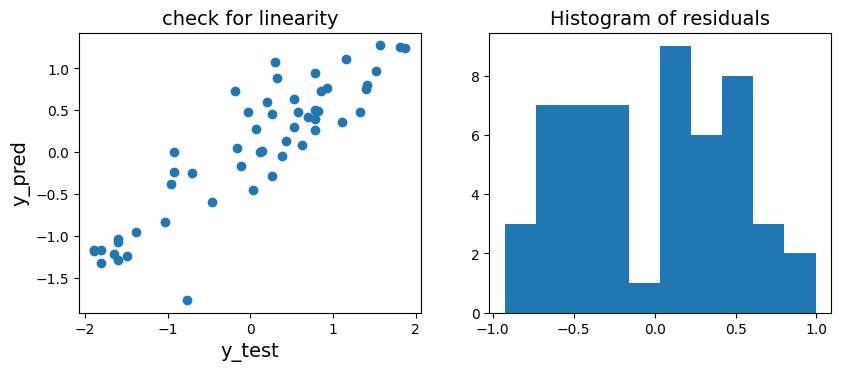

<Figure size 640x480 with 0 Axes>

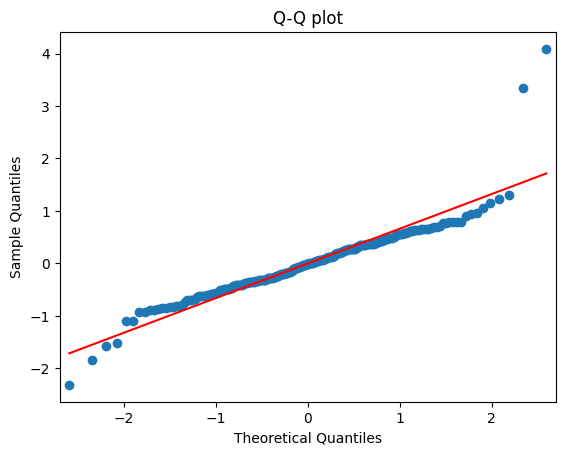

In [366]:
olsModel = sm.OLS(y_train,X_train)
olsFit = olsModel.fit()# print(olsModel_fit.summary())

y_pred = olsFit.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Display metrics
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R2: {r2}")


plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.scatter(y_test, y_pred)
plt.xlabel('y_test',fontsize=14), plt.ylabel('y_pred',fontsize=14)
plt.title('check for linearity',fontsize=14)
plt.subplot(2,3,2)
plt.hist(y_test - y_pred)
plt.title('Histogram of residuals',fontsize=14)

#qq-plot
plt.figure(num=3)
sm.qqplot(olsFit.resid,line='s')
plt.title("Q-Q plot")

We thus conclude that the above factors are better in predicting the salary but only explain to 40% of the variance in salary.

Now that we know number of times at batting and number of hits taken detremine the salary. How external factors are affecting this performance metrics.
From our understanding we already know that there are few factors like years at major league which affect salary which are correlated to the performance.

In [45]:
interesting_params = ["NumberHits1986"]
external_factors_columns = [
    'LeagueEnd1986Vals', 'DivisionEnd1986Vals', 'TeamEnd1986Vals', 'Position1986Vals', 'League1987Vals', 'Team1987Vals', 'YearsMajorleag'
]
external_factors_values_columns = [
    'LeagueEnd1986Labels', 'DivisionEnd1986Labels', 'TeamEnd1986Labels', 'Position1986Labels', 'League1987Labels', 'Team1987Labels', 'YearsMajorleag'
]


def transform_labels(map):
  def mapper(val):
    return map[val]
  return mapper
hitters_copy["LeagueEnd1986Vals"] = hitters_copy["LeagueEnd1986"].transform(transform_labels(LEAGUE_MAPPINGS))
hitters_copy["DivisionEnd1986Vals"] = hitters_copy["DivisionEnd1986"].transform(transform_labels(DIVISION_MAPPINGS))
hitters_copy["TeamEnd1986Vals"] = hitters_copy["TeamEnd1986"].transform(transform_labels(TEAM_NAME_MAPPINGS))
hitters_copy["Position1986Vals"] = hitters_copy["Position1986"].transform(transform_labels(PLAYER_POSITION_MAPPINGS))
hitters_copy["League1987Vals"] = hitters_copy["League1987"].transform(transform_labels(LEAGUE_MAPPINGS))
hitters_copy["Team1987Vals"] = hitters_copy["Team1987"].transform(transform_labels(TEAM_NAME_MAPPINGS))
hitters.head()
top_n = int(len(hitters_copy) * 0.1)
top_performers = hitters_copy.nlargest(top_n, interesting_params)
topp = top_performers["Hitter"].to_list()
hitters_copy["TopHitters"] = hitters_copy["Hitter"].transform(lambda x: (x in topp))









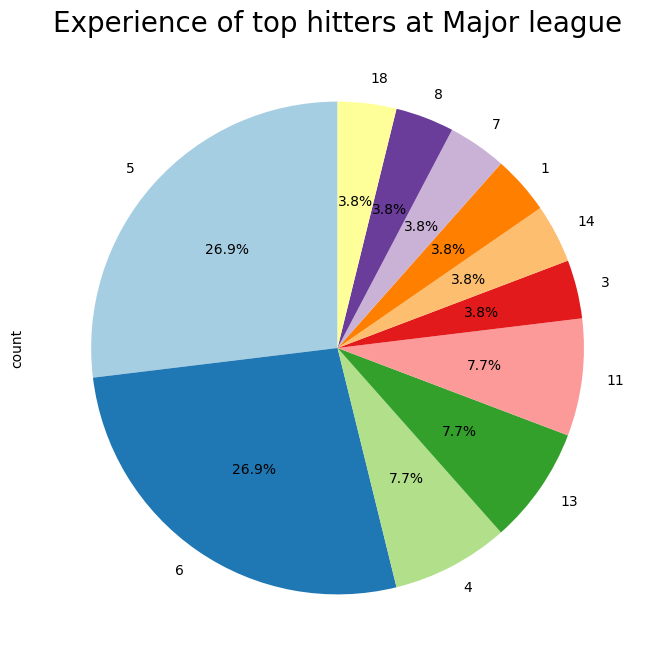

<Axes: xlabel='Count', ylabel='YearsMajorleag'>

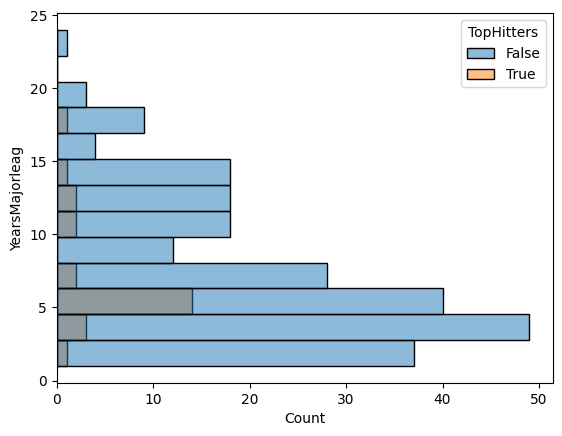

In [100]:
#visualising for categorical variables

counts = top_performers['YearsMajorleag'].value_counts()

plt.figure(figsize=(8, 8))
counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title("Experience of top hitters at Major league", size = 20)
plt.show()
sns.histplot(y='YearsMajorleag', hue="TopHitters", data=hitters_copy)

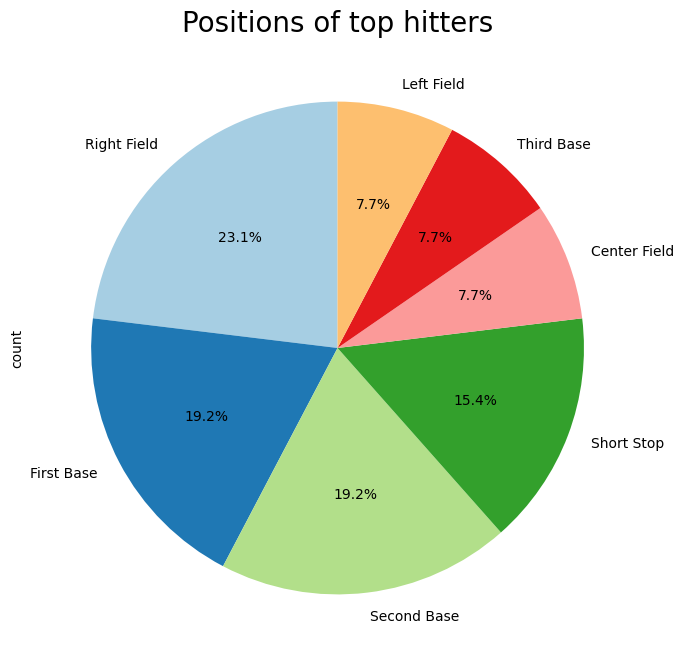

In [48]:
counts = top_performers["Position1986Vals"].value_counts()

plt.figure(figsize=(8, 8))
counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title("Positions of top hitters", size = 20)
plt.show()

<Axes: ylabel='Top Hitters'>

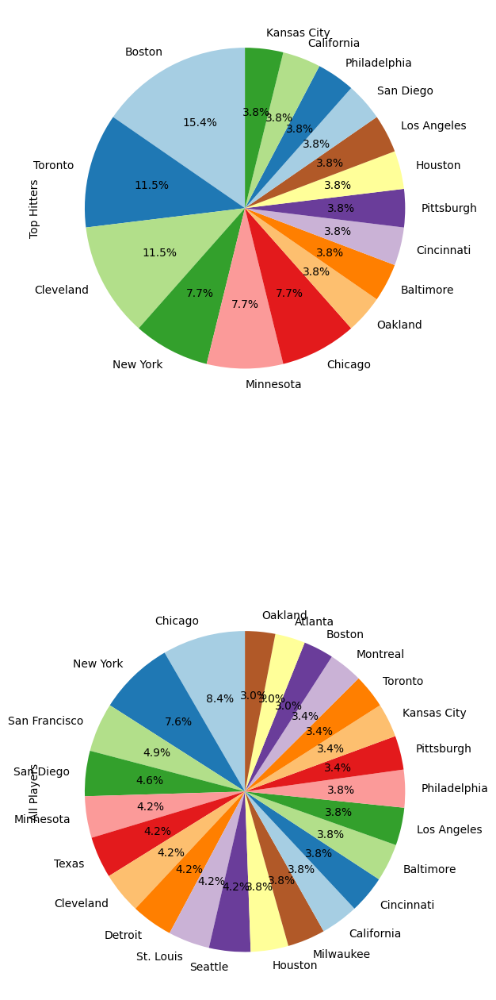

In [101]:
top_counts = hitters_copy[hitters_copy['TopHitters'] == True]['TeamEnd1986Vals'].value_counts()
total_counts = hitters_copy["TeamEnd1986Vals"].value_counts()
# print(counts)
# print(total_counts)

plt.figure(figsize=(30, 35))
plt.subplot(1,4,1)
total_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors, label="All Players")
plt.subplot(2,4,1)
top_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors, label="Top Hitters")



# plt.figure(figsize=(8, 8))
# counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
# plt.title("Proportion of teams represented by top hitters", size = 20)
# plt.show()
# # sns.histplot(y='YearsMajorleag', data=top_performers)

# hitters["TopHitters"].head()
# sns.countplot(y='TeamEnd1986Vals', hue="TopHitters", data=hitters_copy)

In [88]:
from scipy.stats import f_oneway



for factor in external_factors_columns:
  # Perform one-way ANOVA
  groups = [group['NumberHits1986'].values for _, group in hitters.groupby(factor)]
  f_stat, p_value = f_oneway(*groups)
  print(f"Factor: {factor}")
  print(f"F-statistic: {f_stat}")
  print(f"P-value: {p_value}")
  print("*"*10)


Factor: LeagueEnd1986Vals
F-statistic: 3.300468043319057
P-value: 0.07019555463111382
**********
Factor: DivisionEnd1986Vals
F-statistic: 1.6278424675410479
P-value: 0.2029270485854989
**********
Factor: TeamEnd1986Vals
F-statistic: 0.8995474683459405
P-value: 0.5994589085829798
**********
Factor: Position1986Vals
F-statistic: 4.653899925554586
P-value: 6.066731786414835e-11
**********
Factor: League1987Vals
F-statistic: 1.179800294535779
P-value: 0.2782141870181768
**********
Factor: Team1987Vals
F-statistic: 0.9034143260307004
P-value: 0.5942091811343222
**********
Factor: YearsMajorleag
F-statistic: 1.5533499927761933
P-value: 0.05948666614576115
**********


In [87]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from itertools import combinations_with_replacement

for factor1 in external_factors_columns:
  factor2 = "TeamEnd1986Labels"
  if factor1 == factor2: continue
  formula = f'NumberHits1986 ~ C({factor1}) + C({factor2}) + C({factor1}):C({factor2})'

  # Fit the model
  model = ols(formula, data=hitters).fit()
  anova_table = sm.stats.anova_lm(model, typ=2)  # Type II ANOVA

  print(anova_table)
  print("****"*100)


/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  warnings.warn('covariance of constraints does not have full '
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1923: RuntimeWarning: invalid value encountered in divide
  F /= J
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 23, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of const

                                                  sum_sq     df         F  \
C(LeagueEnd1986Vals)                                 NaN    1.0       NaN   
C(TeamEnd1986Labels)                         3674.385637   23.0  0.073385   
C(LeagueEnd1986Vals):C(TeamEnd1986Labels)   26926.312070   23.0  0.537777   
Residual                                   644374.846603  296.0       NaN   

                                             PR(>F)  
C(LeagueEnd1986Vals)                            NaN  
C(TeamEnd1986Labels)                       0.929259  
C(LeagueEnd1986Vals):C(TeamEnd1986Labels)  0.876957  
Residual                                        NaN  
********************************************************************************************************************************************************************************************************************************************************************************************************************************************************

/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 552, but rank is 225
  warnings.warn('covariance of constraints does not have full '
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  warnings.warn('covariance of constraints does not have full '
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1923: RuntimeWarning: invalid value encountered in divide
  F /= J
/Users/bhargavcn/NEU_Projects/baseball-performance-analysis/venv/lib/python3.11/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of co

<Axes: xlabel='count', ylabel='Position1986Vals'>

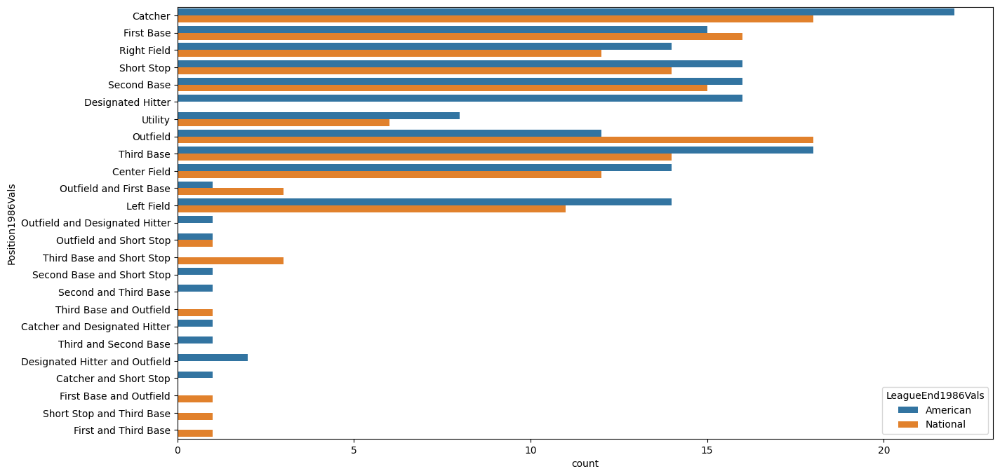

In [76]:
# LeagueEnd1986Labels):C(Position1986Labels)
hitters
plt.figure(figsize=(15,8))
sns.countplot(y='Position1986Vals', hue="LeagueEnd1986Vals", data=hitters)
# plt.xlabel('LeagueEnd1986',fontsize=14), plt.ylabel('Position1986',fontsize=14)
# plt.title('Check for interaction',fontsize=14)


LeagueEnd1986Vals
American    175
National    147
Name: count, dtype: int64
Shapiro-Wilk test for team American: p-value = 0.06863424610620268


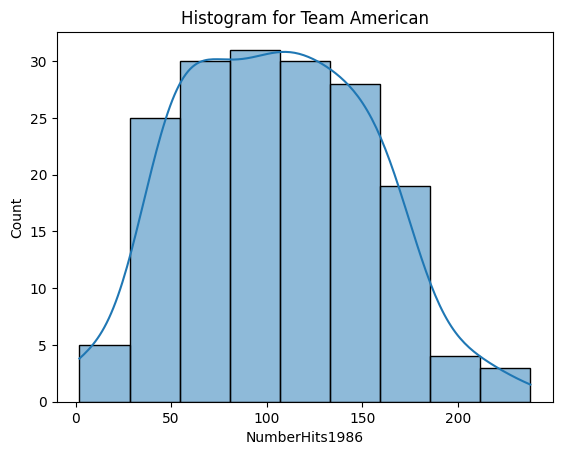

Shapiro-Wilk test for team National: p-value = 0.003776280633511289


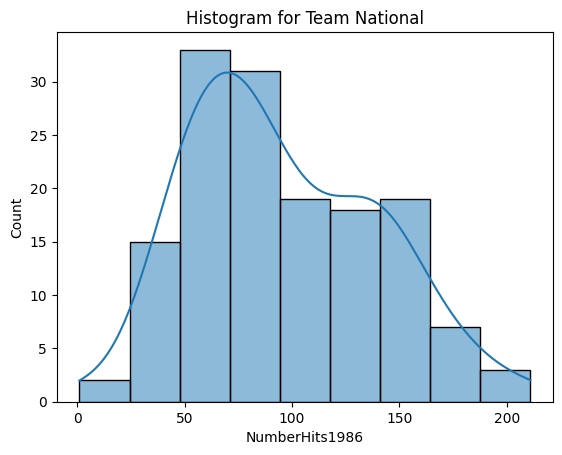

Levene's Test: p-value = 0.21338568234931563
ANOVA Test: p-value = 0.07019555463111382
*************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

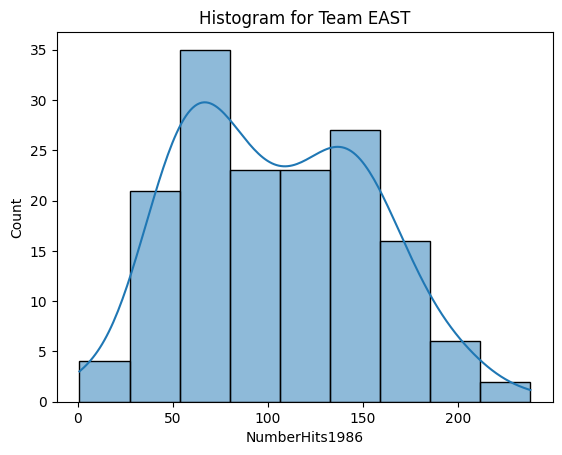

Shapiro-Wilk test for team WEST: p-value = 0.04274234301159213


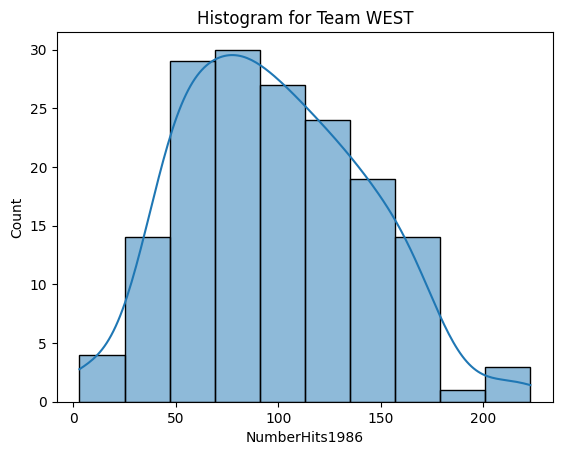

Levene's Test: p-value = 0.030822725121756805
ANOVA Test: p-value = 0.2029270485854989
*************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

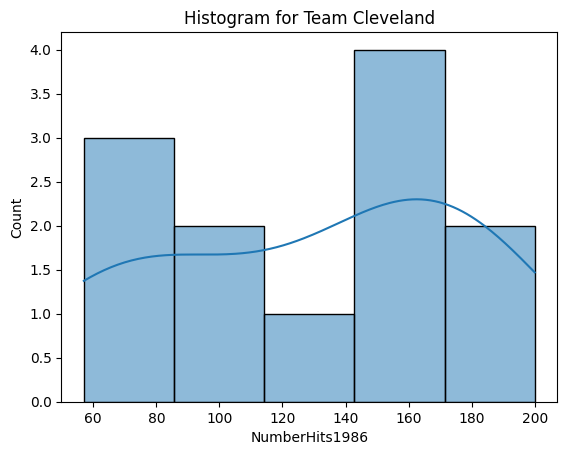

Shapiro-Wilk test for team Houston: p-value = 0.8448766895277458


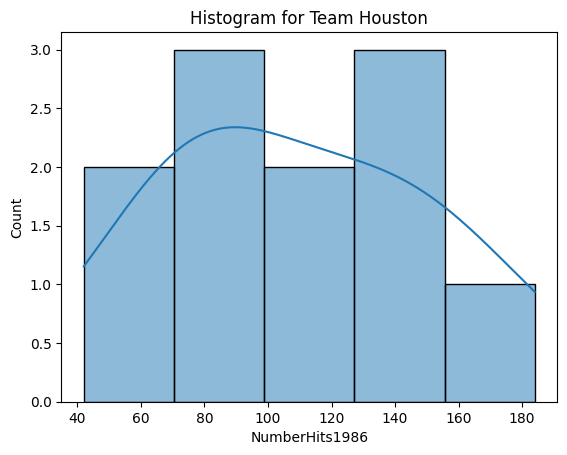

Shapiro-Wilk test for team Seattle: p-value = 0.6816513159682407


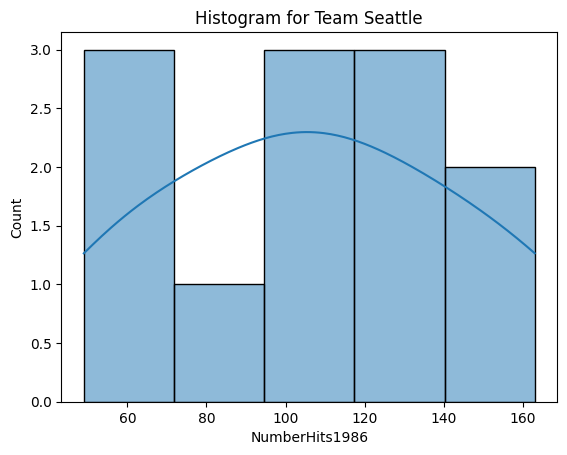

Shapiro-Wilk test for team Montreal: p-value = 0.09480006482369294


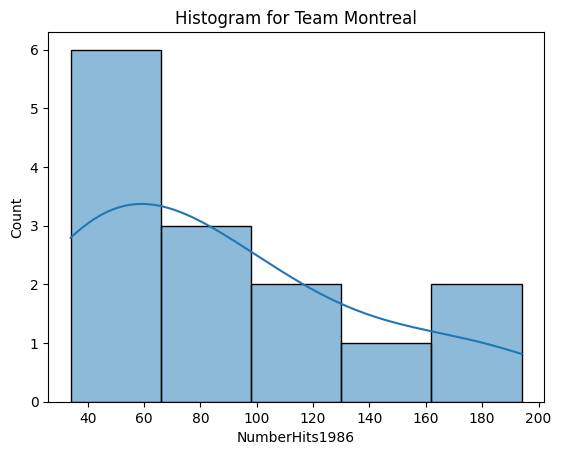

Shapiro-Wilk test for team Oakland: p-value = 0.65880753597596


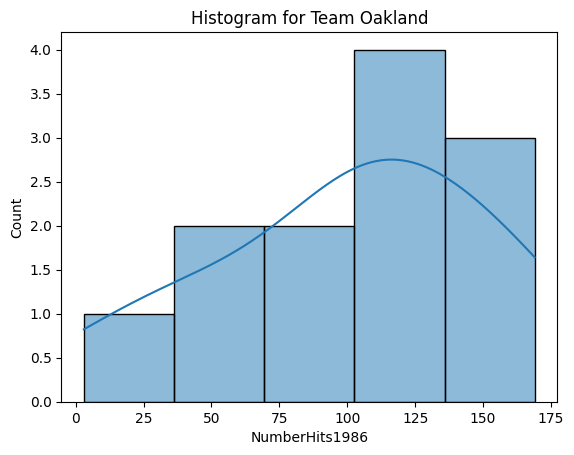

Shapiro-Wilk test for team Kansas City: p-value = 0.173579541321484


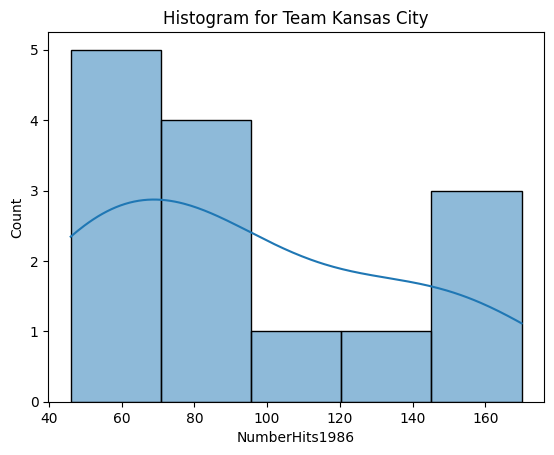

Shapiro-Wilk test for team Atlanta: p-value = 0.8485724500183276


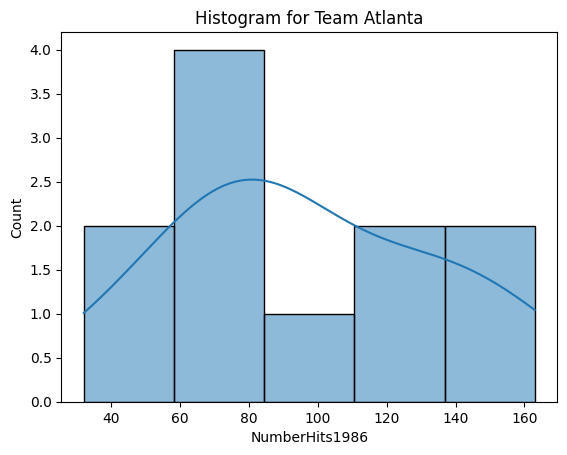

Shapiro-Wilk test for team Detroit: p-value = 0.4418758910932369


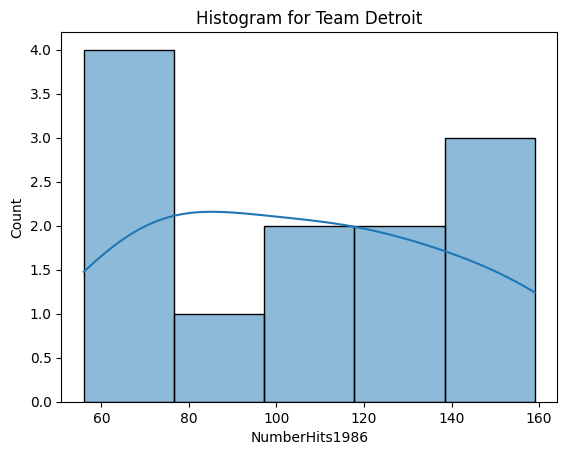

Shapiro-Wilk test for team Los Angeles: p-value = 0.0004475425076469541


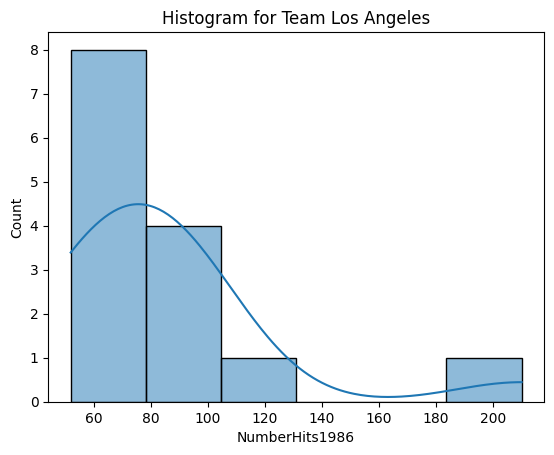

Shapiro-Wilk test for team St. Louis: p-value = 0.02581685926555827


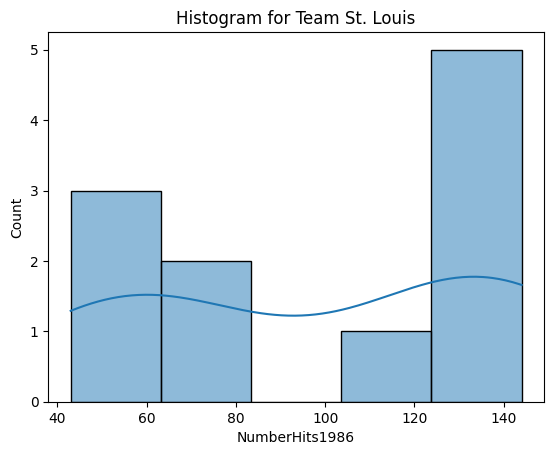

Shapiro-Wilk test for team Baltimore: p-value = 0.31011527954836754


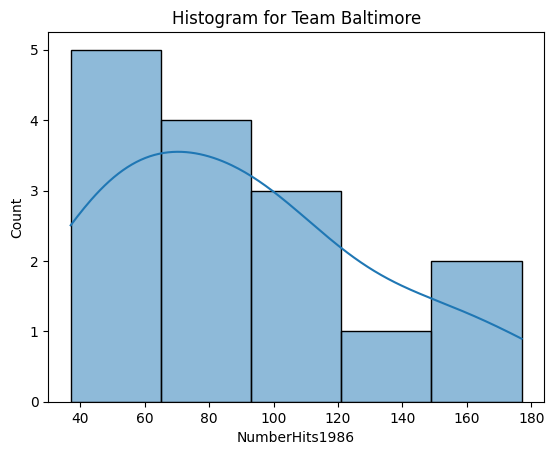

Shapiro-Wilk test for team Pittsburgh: p-value = 0.4137151658811914


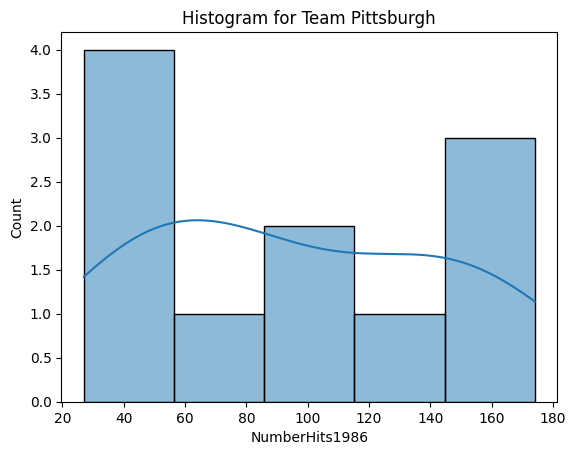

Shapiro-Wilk test for team Minnesota: p-value = 0.5500139698296665


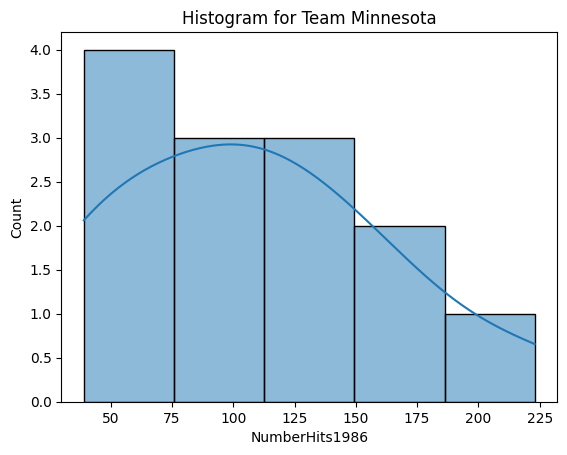

Shapiro-Wilk test for team Cincinnati: p-value = 0.29058217846697443


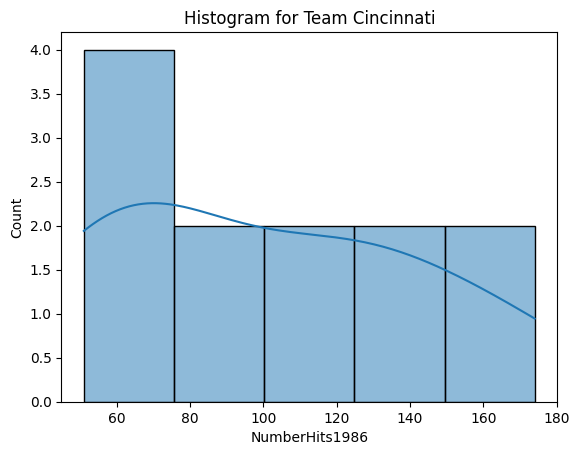

Shapiro-Wilk test for team San Diego: p-value = 0.818137351917724


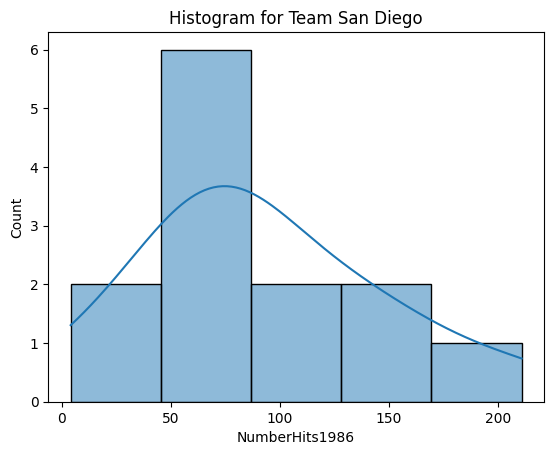

Shapiro-Wilk test for team Chicago: p-value = 0.4688362710894163


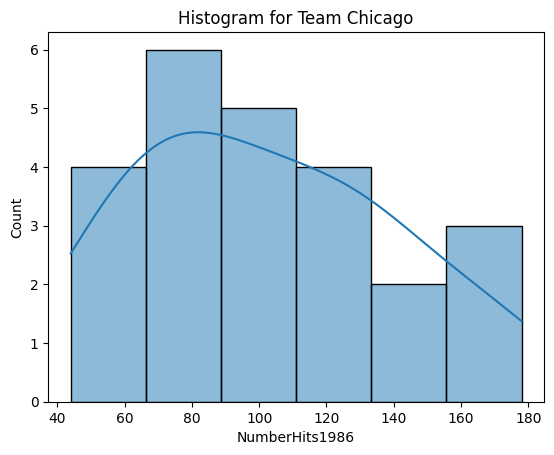

Shapiro-Wilk test for team California: p-value = 0.8278051676059692


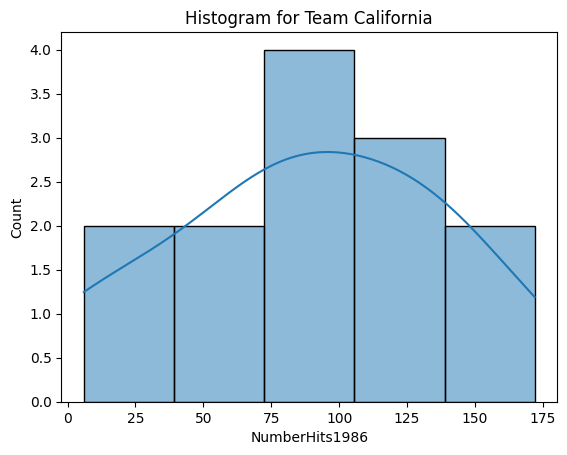

Shapiro-Wilk test for team San Francisco: p-value = 0.2170485176685253


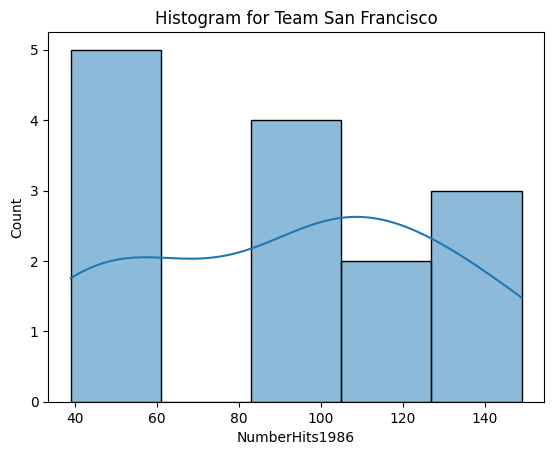

Shapiro-Wilk test for team Boston: p-value = 0.4916223104475707


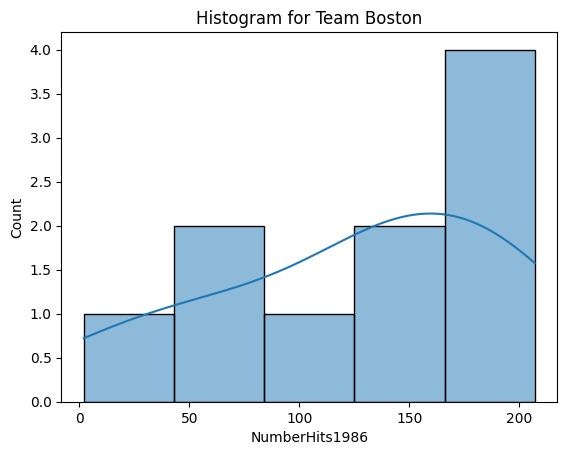

Shapiro-Wilk test for team New York: p-value = 0.3967327427700129


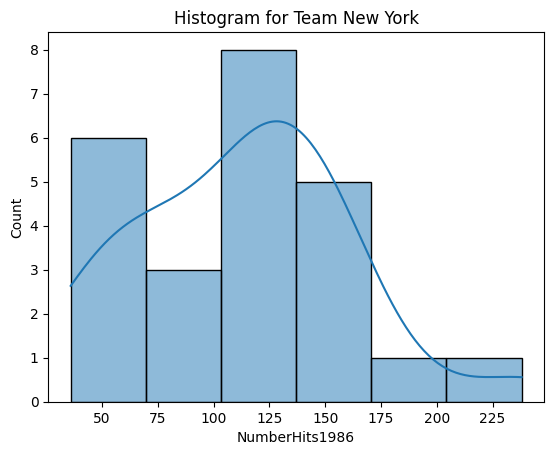

Shapiro-Wilk test for team Milwaukee: p-value = 0.12361347735685559


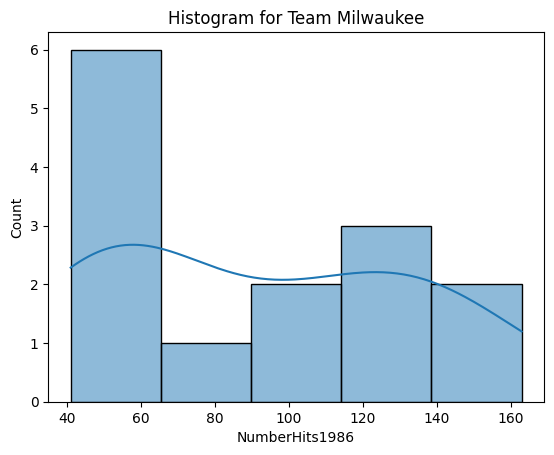

Shapiro-Wilk test for team Toronto: p-value = 0.9271197797629356


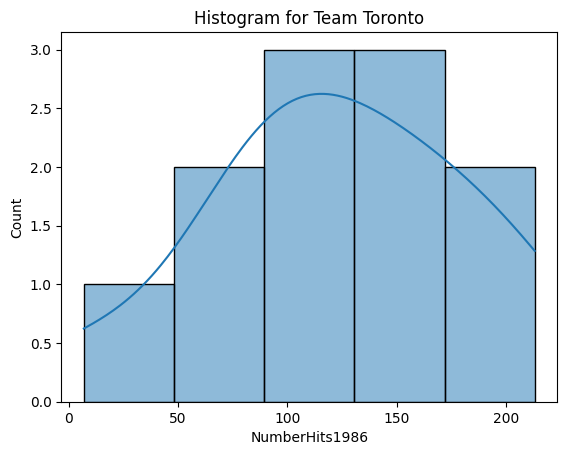

Shapiro-Wilk test for team Texas: p-value = 0.339732823560967


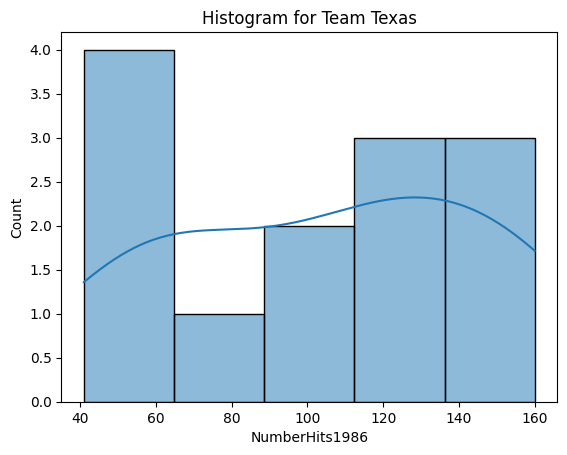

Shapiro-Wilk test for team Philadelphia: p-value = 0.3566691616523417


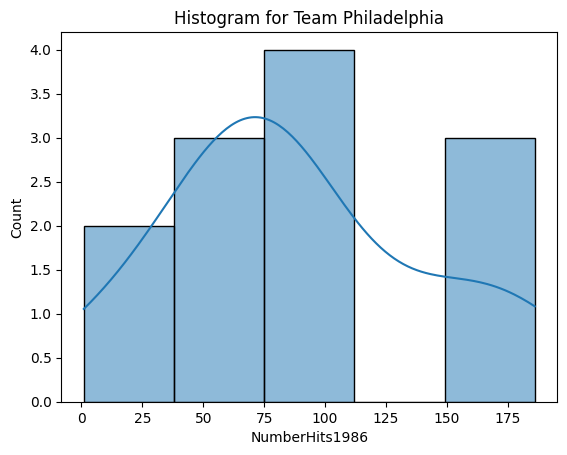

Levene's Test: p-value = 0.9366889009262303
ANOVA Test: p-value = 0.5994589085829842
***************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

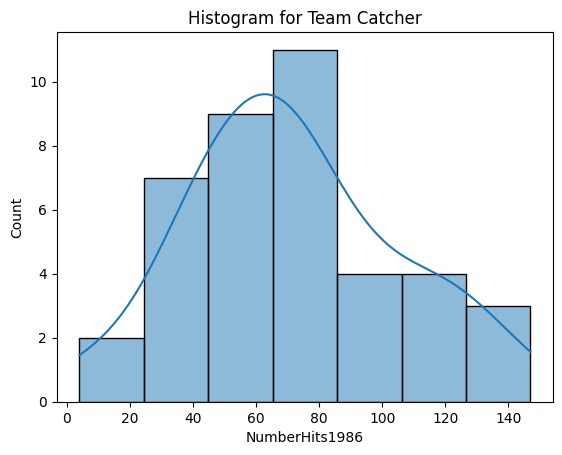

Shapiro-Wilk test for team First Base: p-value = 0.20965209837869156


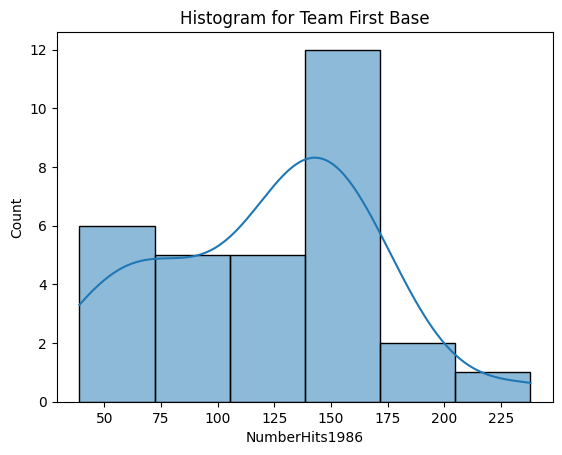

Shapiro-Wilk test for team Right Field: p-value = 0.21189465311804928


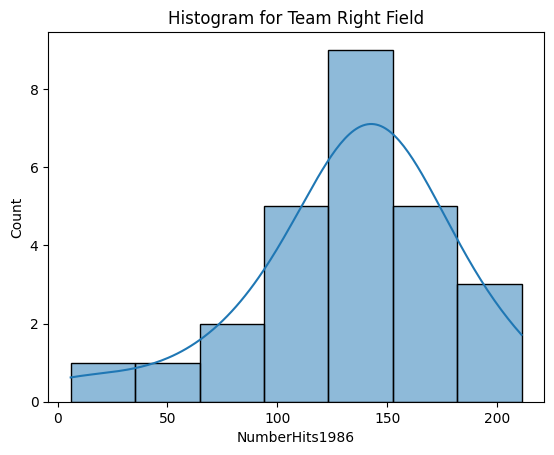

Shapiro-Wilk test for team Short Stop: p-value = 0.6417158143262753


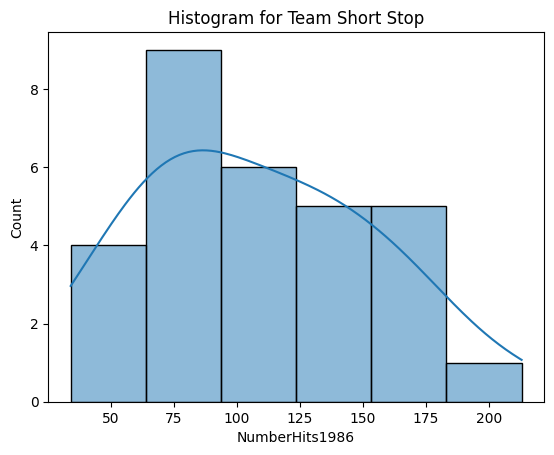

Shapiro-Wilk test for team Second Base: p-value = 0.4018341134008749


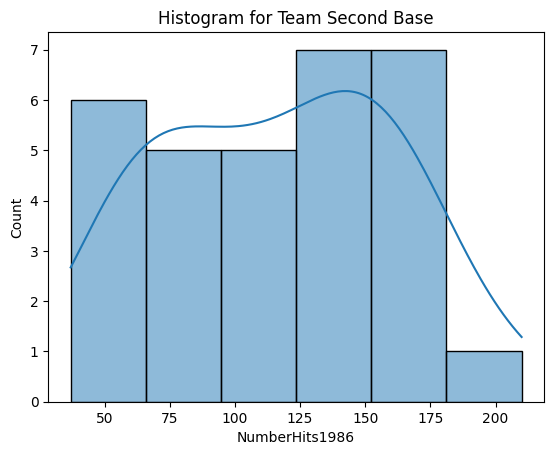

Shapiro-Wilk test for team Designated Hitter: p-value = 0.46841532663079327


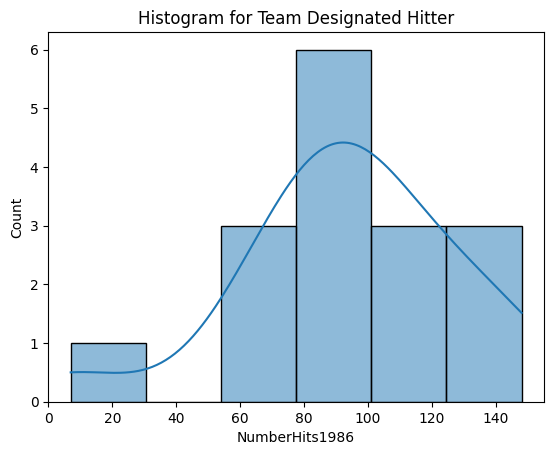

Shapiro-Wilk test for team Utility: p-value = 0.9998683905781355


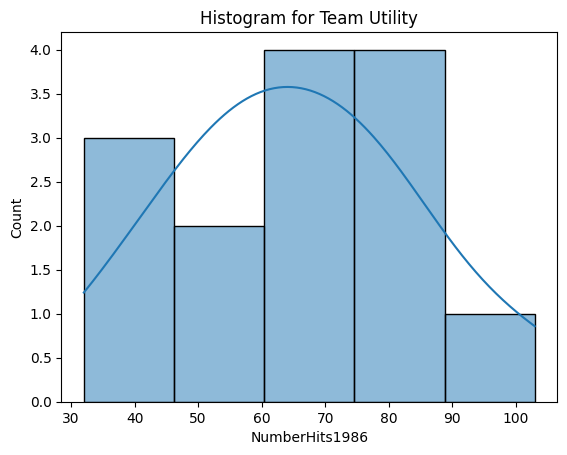

Shapiro-Wilk test for team Outfield: p-value = 0.12960096701715407


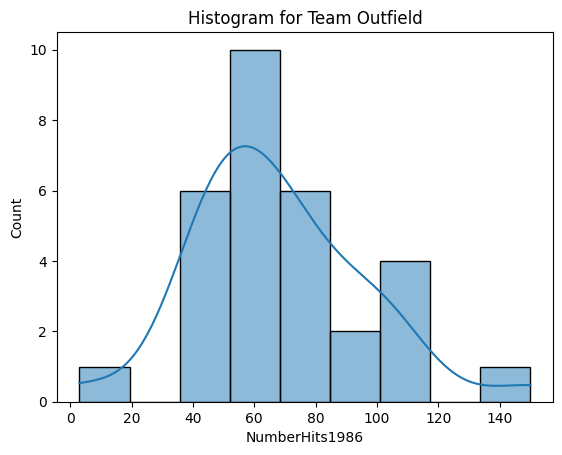

Shapiro-Wilk test for team Third Base: p-value = 0.4846186895621766


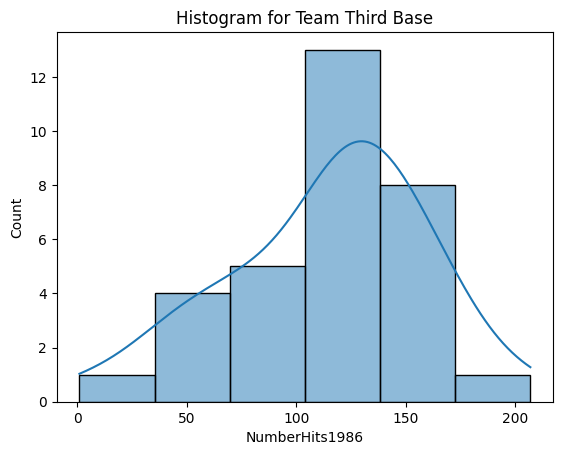

Shapiro-Wilk test for team Center Field: p-value = 0.49307675407800233


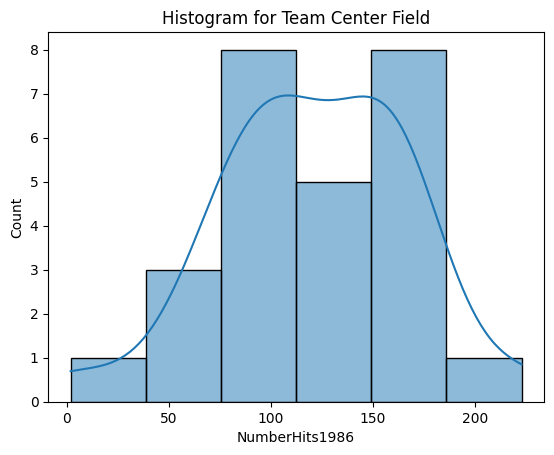

Shapiro-Wilk test for team Outfield and First Base: p-value = 0.017719415977154054


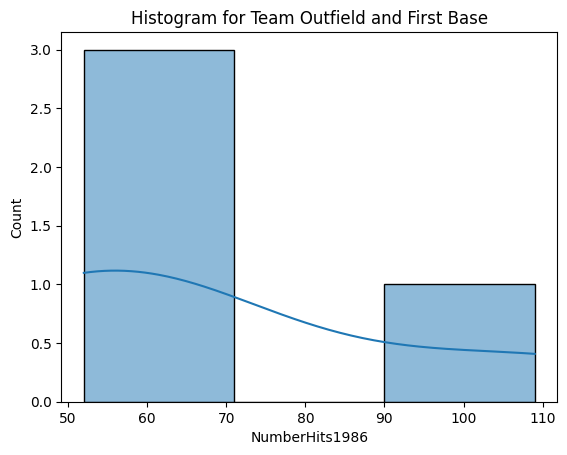

Shapiro-Wilk test for team Left Field: p-value = 0.5164310131426046


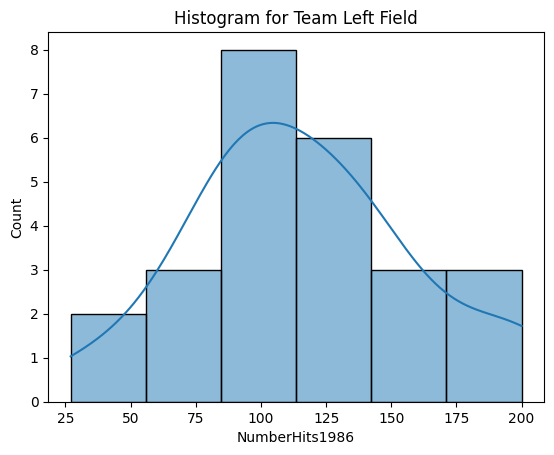

Shapiro-Wilk test for team Outfield and Designated Hitter: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


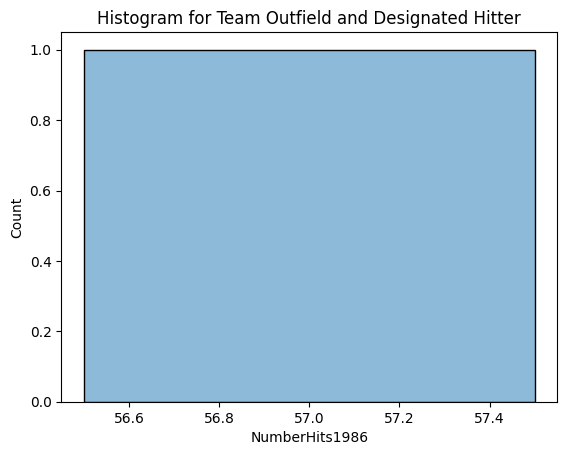

Shapiro-Wilk test for team Outfield and Short Stop: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


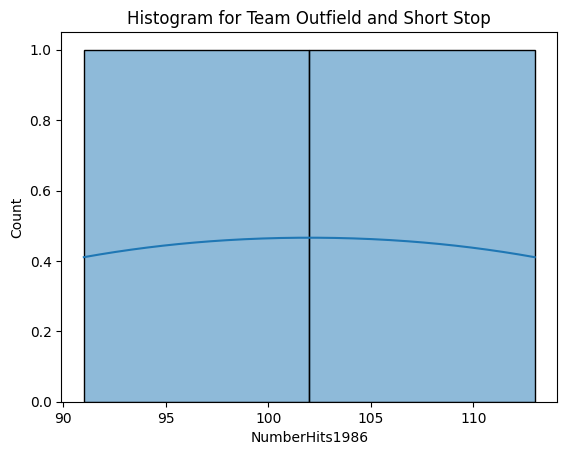

Shapiro-Wilk test for team Third Base and Short Stop: p-value = 0.17362397009517044


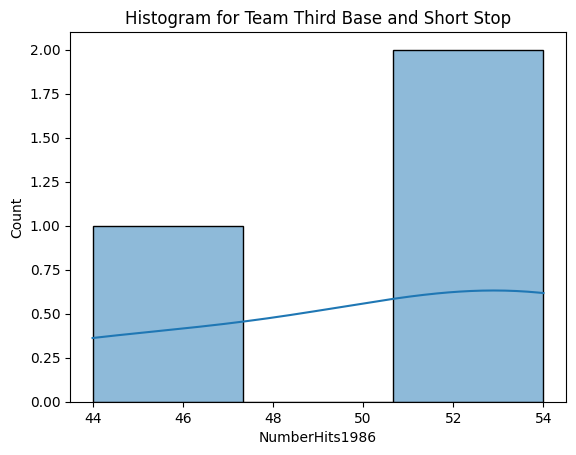

Shapiro-Wilk test for team Second Base and Short Stop: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


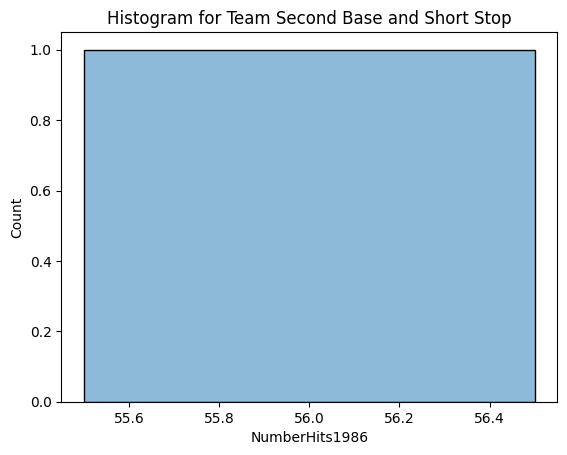

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team Second and Third Base: p-value = nan


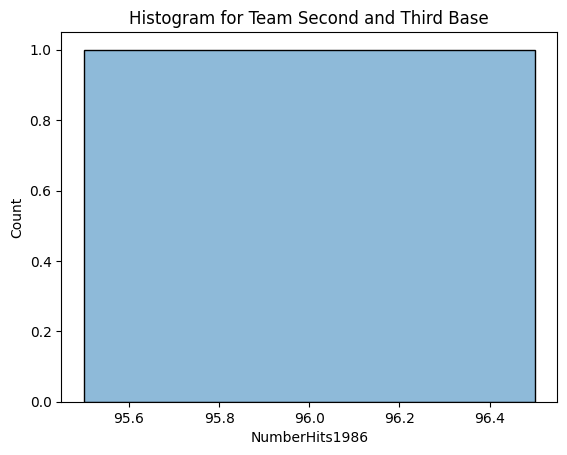

Shapiro-Wilk test for team Third Base and Outfield: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


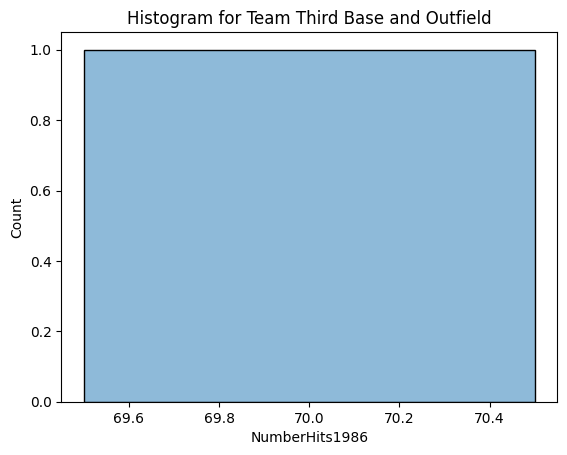

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team Catcher and Designated Hitter: p-value = nan


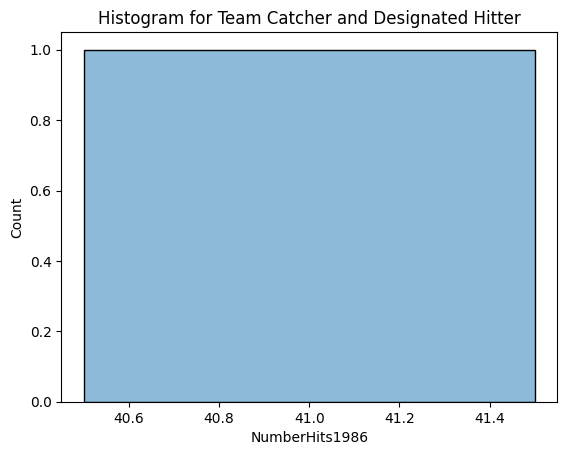

Shapiro-Wilk test for team Third and Second Base: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


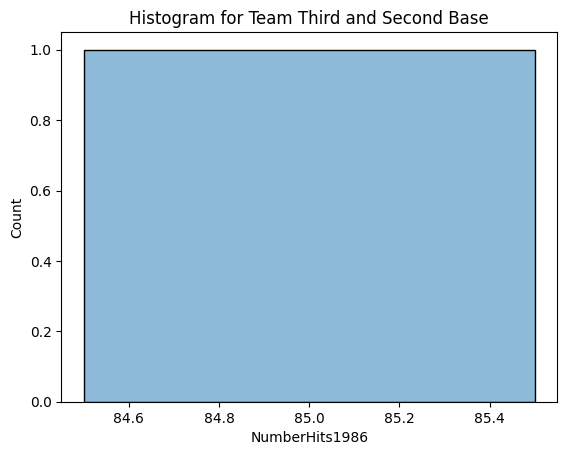

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team Designated Hitter and Outfield: p-value = nan


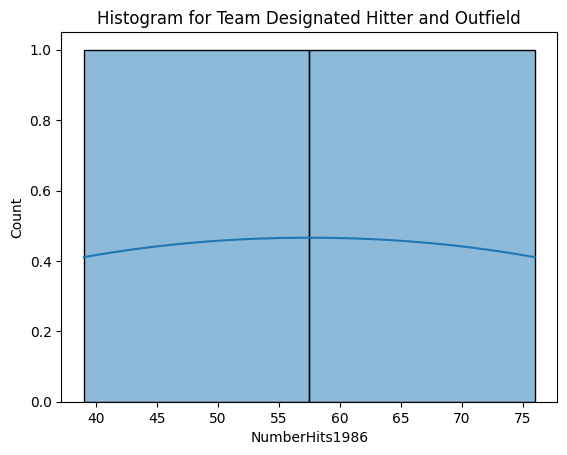

Shapiro-Wilk test for team Catcher and Short Stop: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


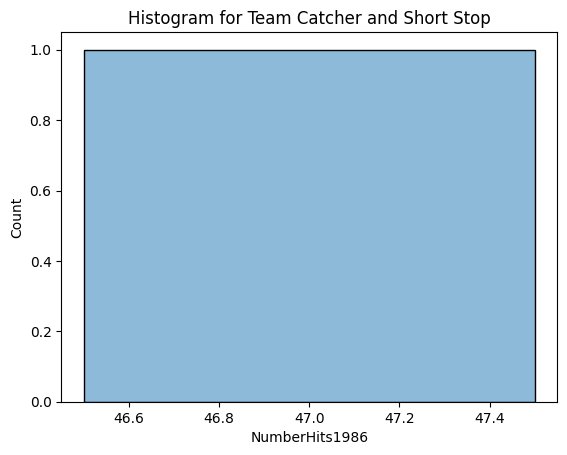

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team First Base and Outfield: p-value = nan


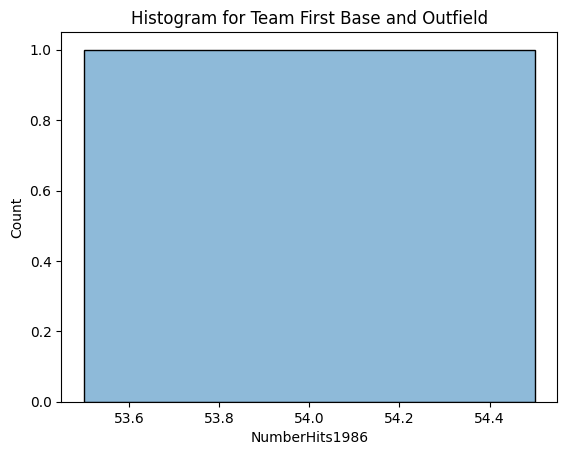

Shapiro-Wilk test for team Short Stop and Third Base: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


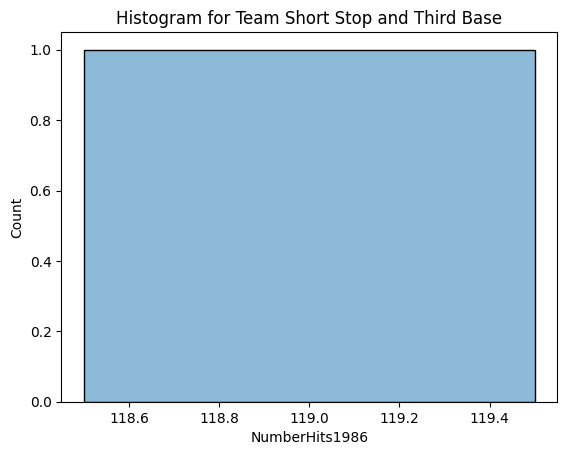

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team First and Third Base: p-value = nan


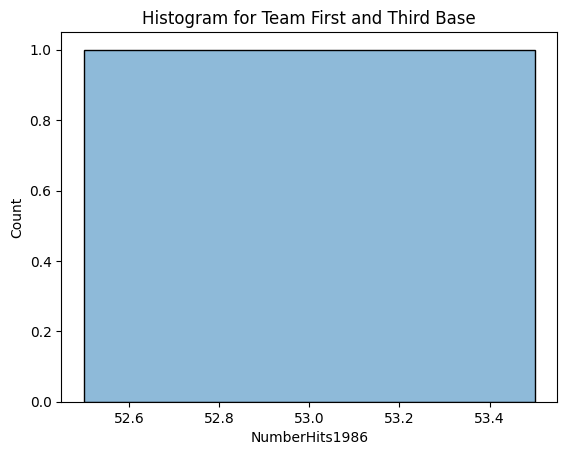

Levene's Test: p-value = 0.007260690106017246
ANOVA Test: p-value = 6.066731786414835e-11
**********************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

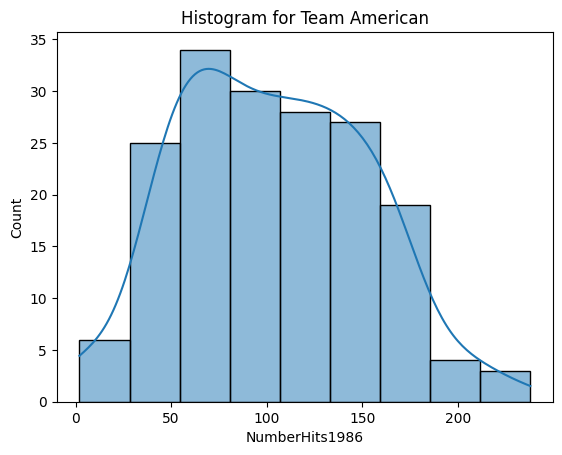

Shapiro-Wilk test for team National: p-value = 0.00551097792222265


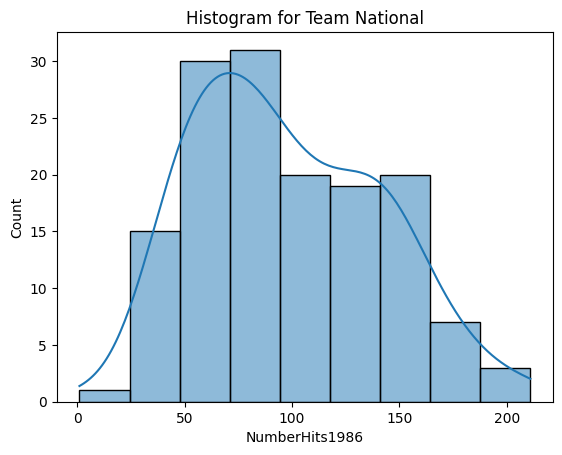

Levene's Test: p-value = 0.1237252354770584
ANOVA Test: p-value = 0.2782141870181768
***************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

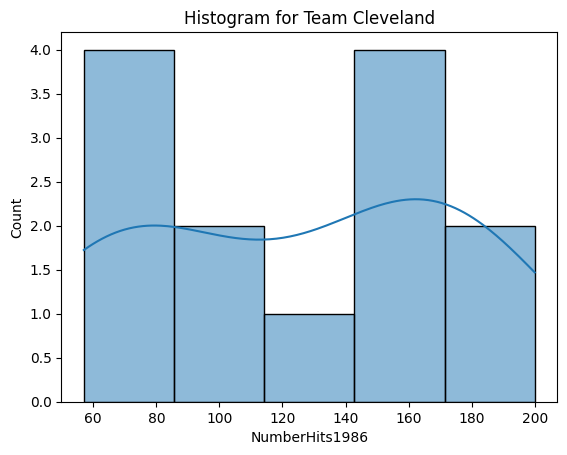

Shapiro-Wilk test for team Houston: p-value = 0.6422789463502783


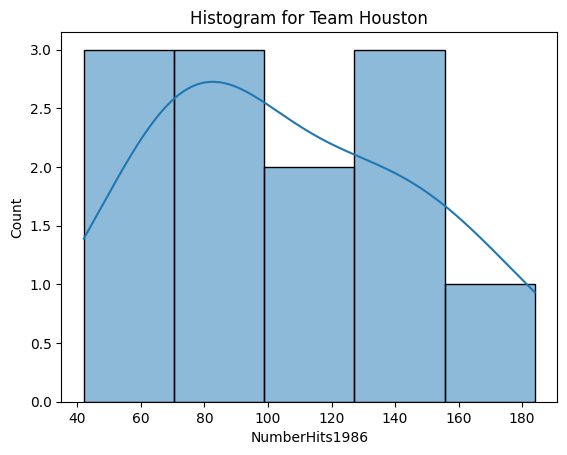

Shapiro-Wilk test for team Seattle: p-value = 0.10279170946255836


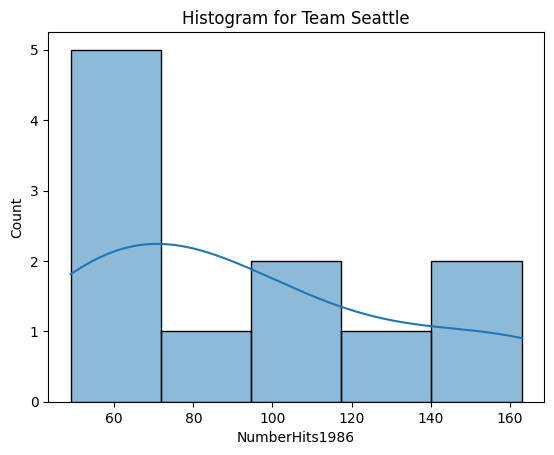

Shapiro-Wilk test for team Chicago: p-value = 0.764731736279223


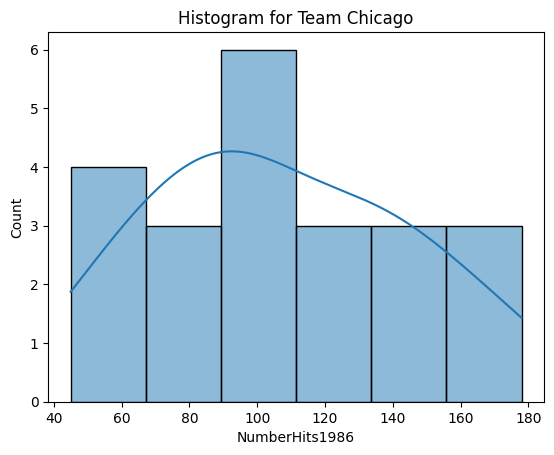

Shapiro-Wilk test for team Montreal: p-value = 0.040238373011719744


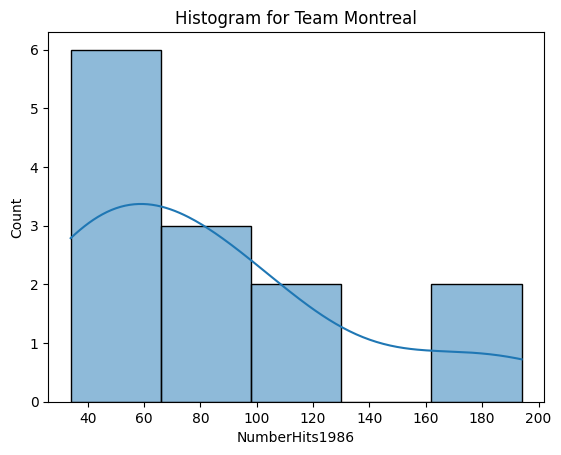

Shapiro-Wilk test for team Oakland: p-value = 0.823509467291938


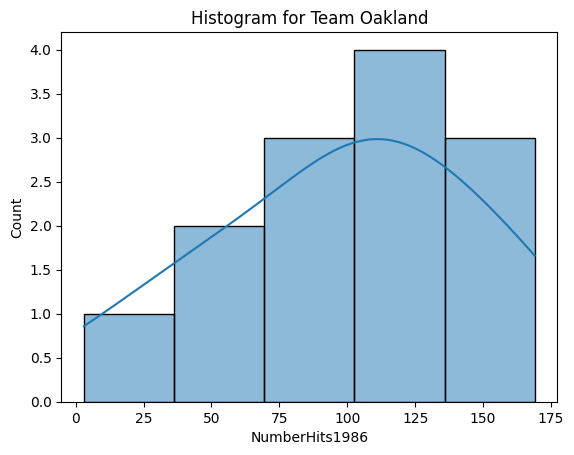

Shapiro-Wilk test for team Minnesota: p-value = 0.5473706337223094


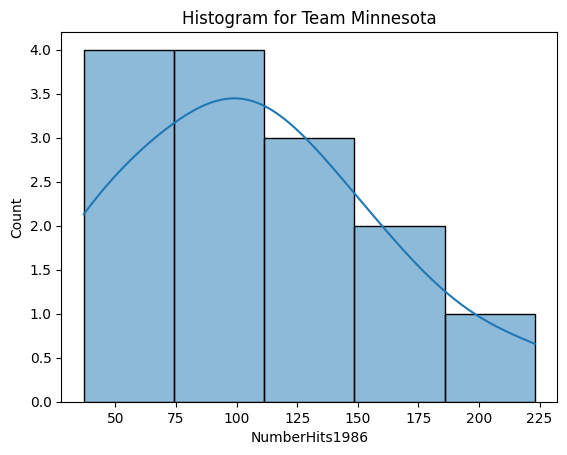

Shapiro-Wilk test for team Kansas City: p-value = 0.37508622470845254


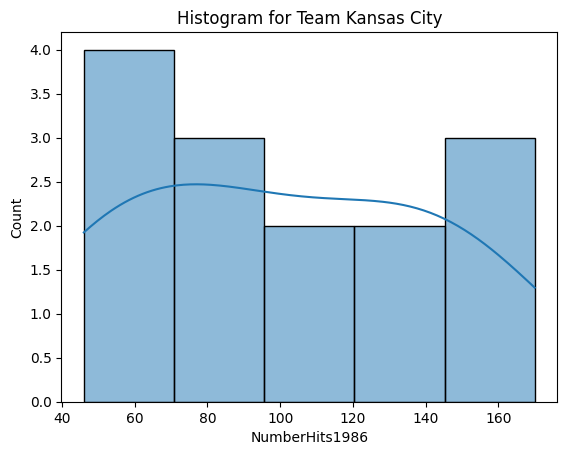

Shapiro-Wilk test for team Atlanta: p-value = 0.6714608884346028


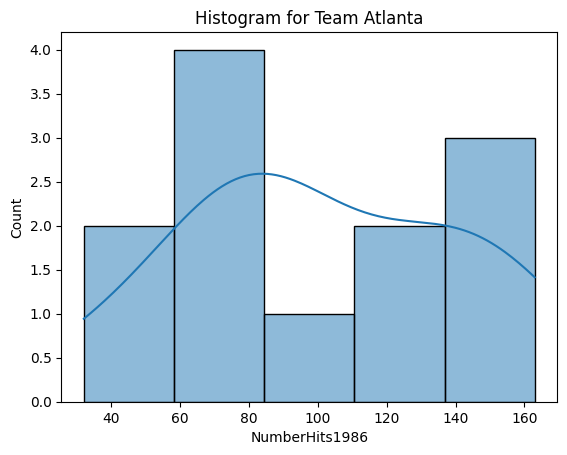

Shapiro-Wilk test for team Detroit: p-value = 0.11854230525308249


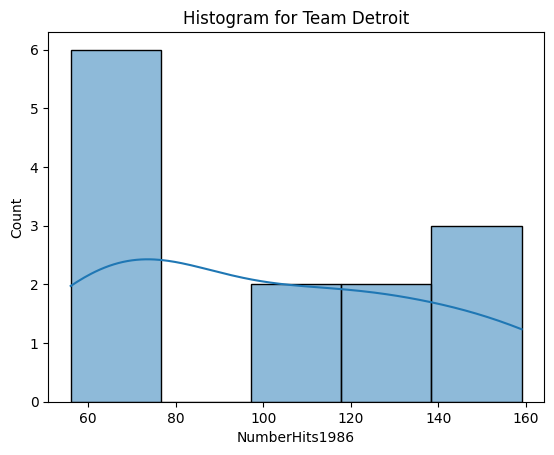

Shapiro-Wilk test for team Los Angeles: p-value = 0.0008567038827522233


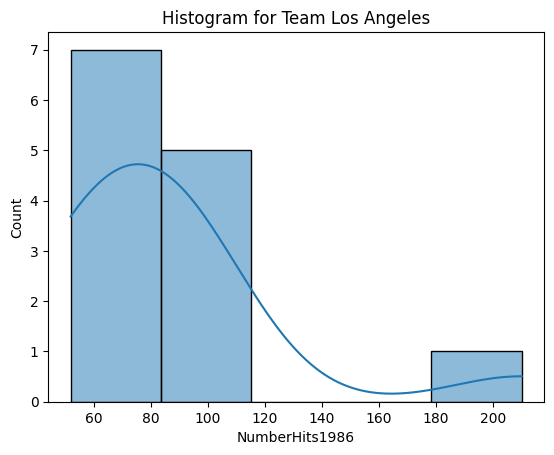

Shapiro-Wilk test for team Pittsburgh: p-value = 0.8847898188944688


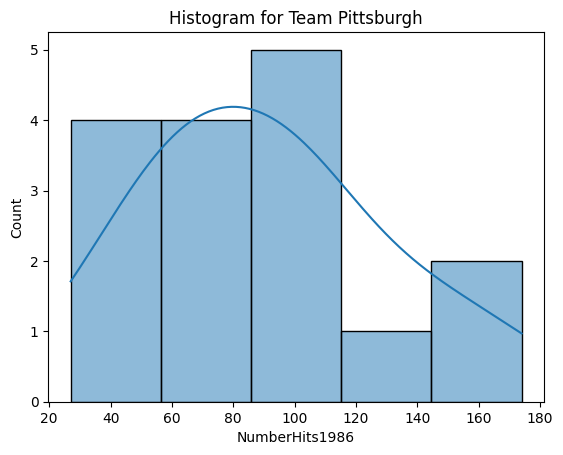

Shapiro-Wilk test for team Baltimore: p-value = 0.7981763807284028


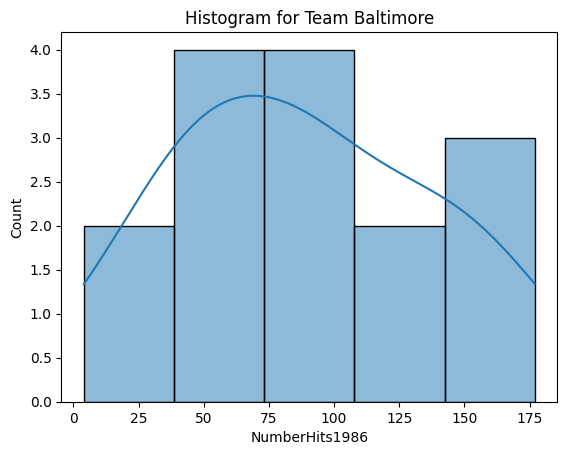

Shapiro-Wilk test for team Cincinnati: p-value = 0.2174413771940122


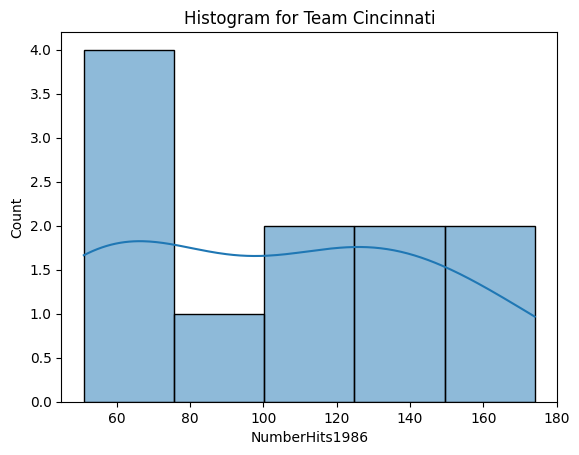

Shapiro-Wilk test for team San Diego: p-value = 0.4360670877310177


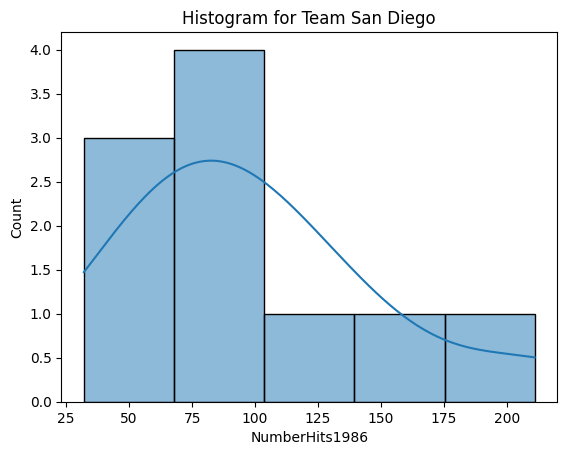

Shapiro-Wilk test for team California: p-value = 0.6347404622691883


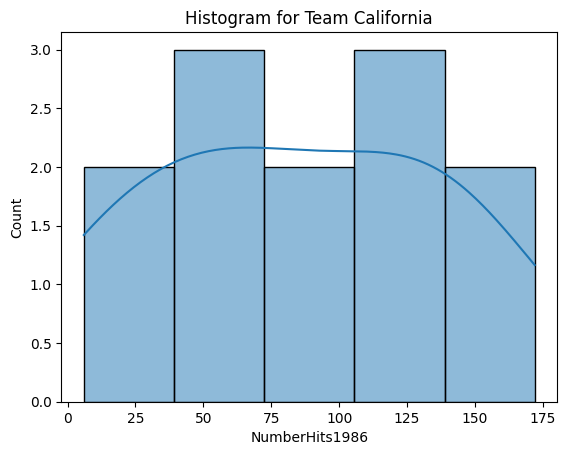

Shapiro-Wilk test for team San Francisco: p-value = 0.09304384816423367


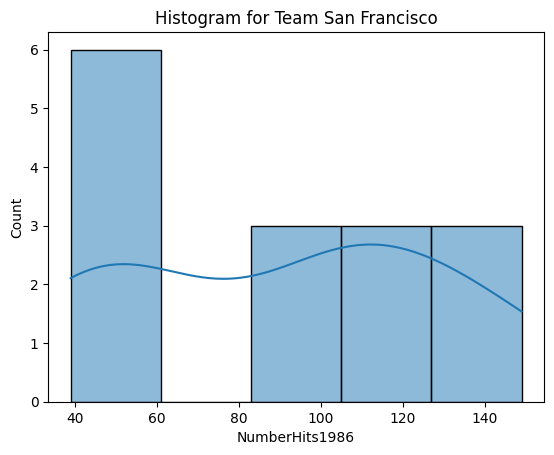

Shapiro-Wilk test for team Boston: p-value = 0.4766760329091224


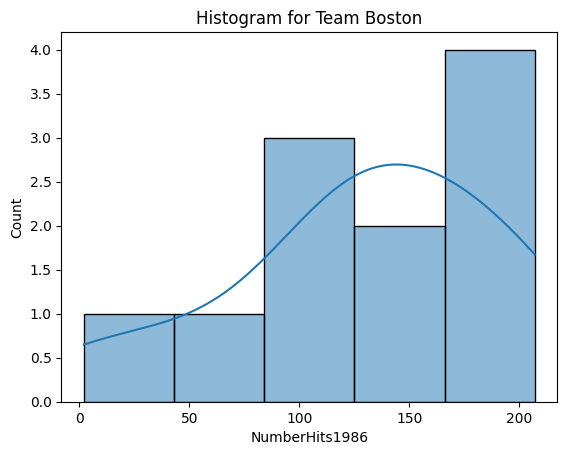

Shapiro-Wilk test for team New York: p-value = 0.21017557212570365


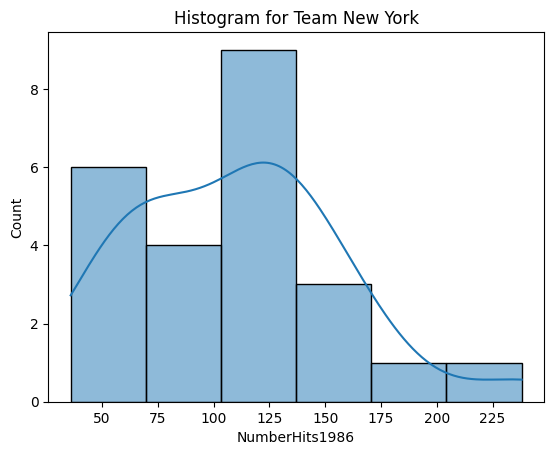

Shapiro-Wilk test for team Milwaukee: p-value = 0.25587555940680023


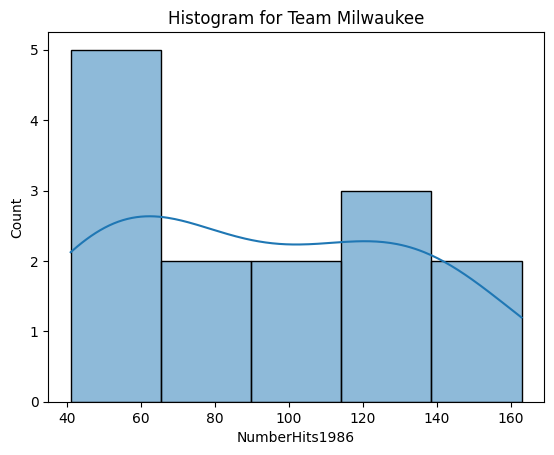

Shapiro-Wilk test for team St. Louis: p-value = 0.0035304986576506787


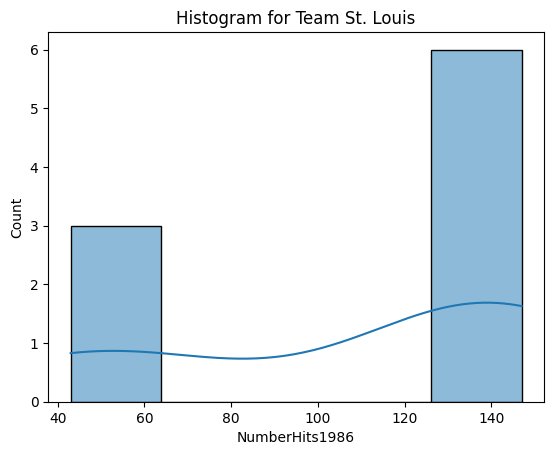

Shapiro-Wilk test for team Toronto: p-value = 0.8559102517872812


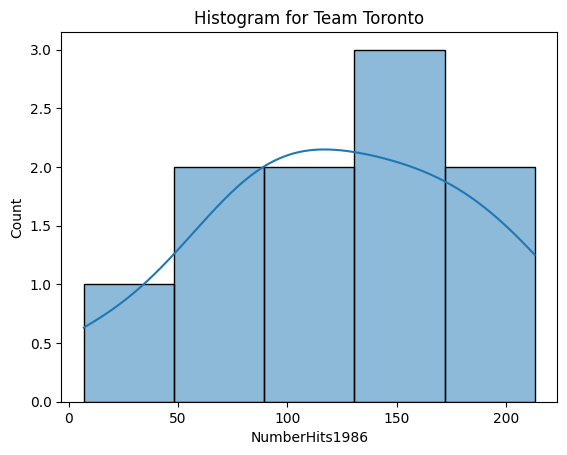

Shapiro-Wilk test for team Texas: p-value = 0.2806422250980545


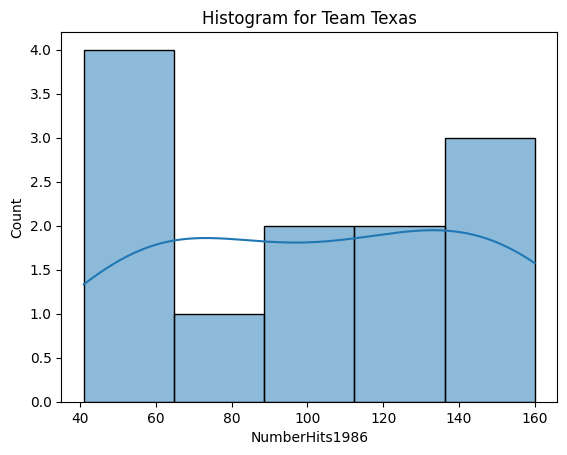

Shapiro-Wilk test for team Philadelphia: p-value = 0.44447989202498134


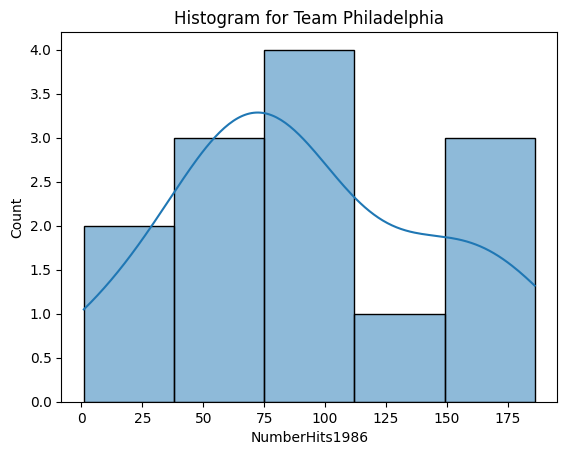

Levene's Test: p-value = 0.9777202030602796
ANOVA Test: p-value = 0.5942091811343222
***************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

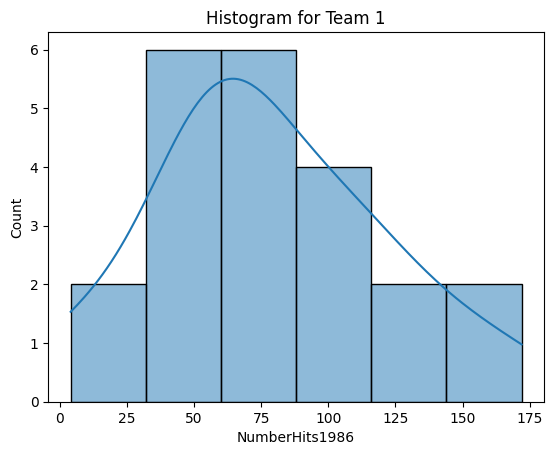

Shapiro-Wilk test for team 14: p-value = 0.4872877871304065


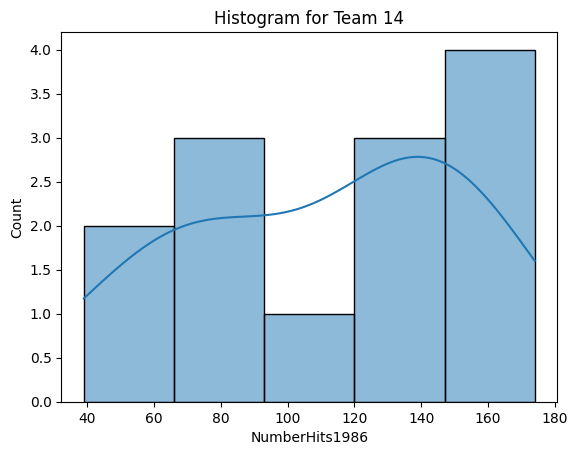

Shapiro-Wilk test for team 3: p-value = 0.3669363633780059


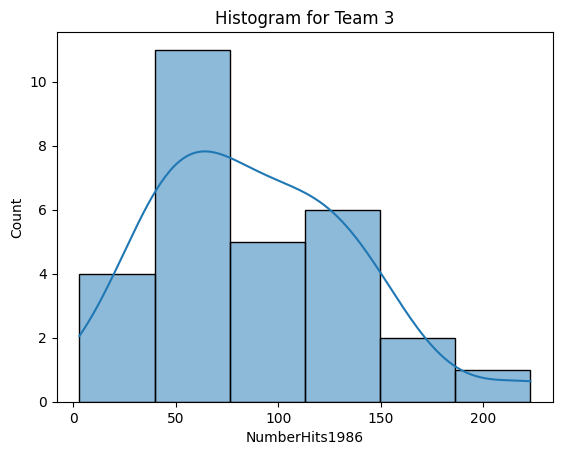

Shapiro-Wilk test for team 11: p-value = 0.03342845250193576


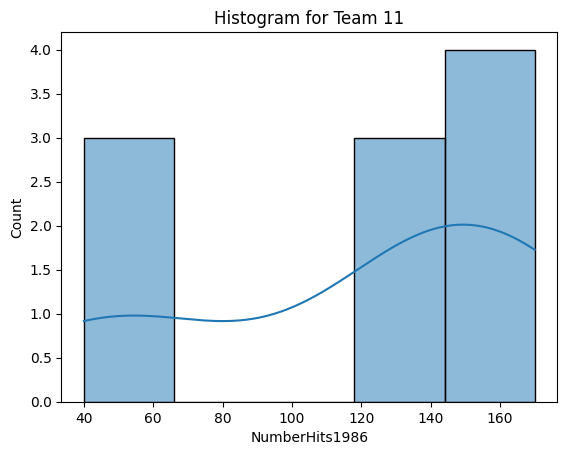

Shapiro-Wilk test for team 2: p-value = 0.30219211429021997


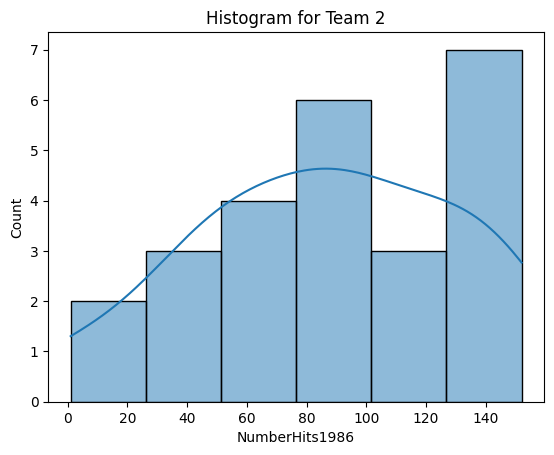

Shapiro-Wilk test for team 13: p-value = 0.9865598042309693


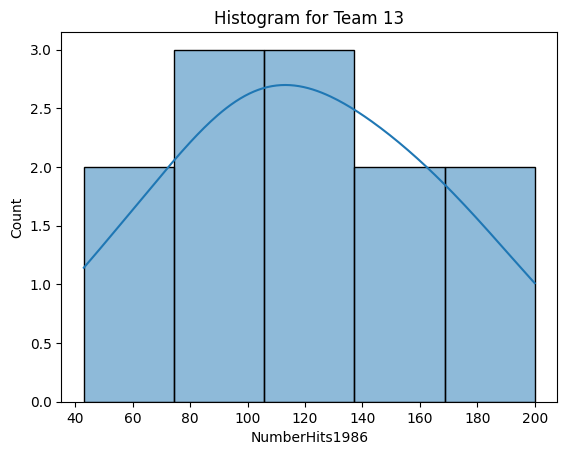

Shapiro-Wilk test for team 10: p-value = 0.2585959049332442


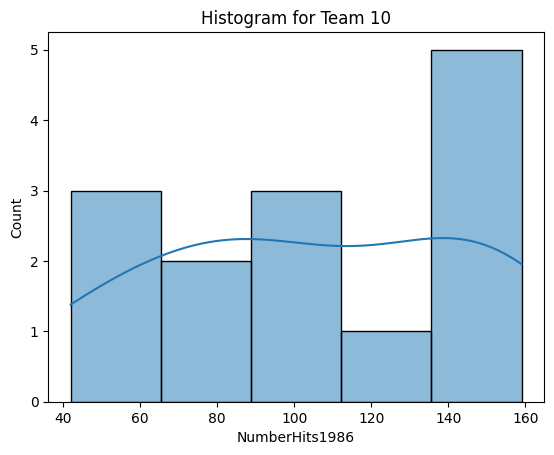

Shapiro-Wilk test for team 9: p-value = 0.3641600276487601


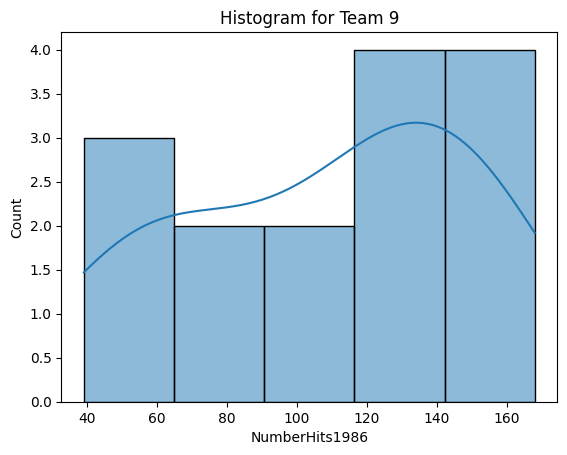

Shapiro-Wilk test for team 4: p-value = 0.5033629338781358


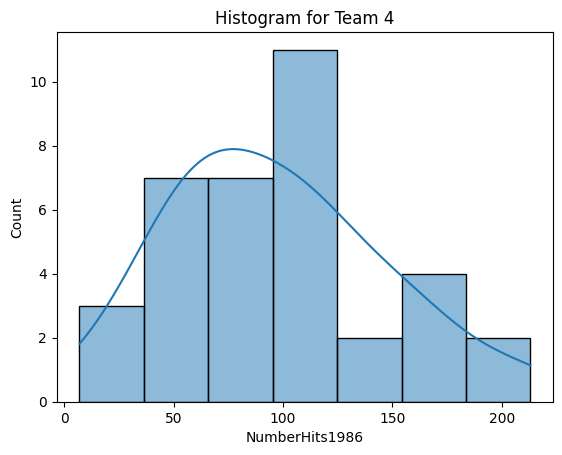

Shapiro-Wilk test for team 6: p-value = 0.35080213309482117


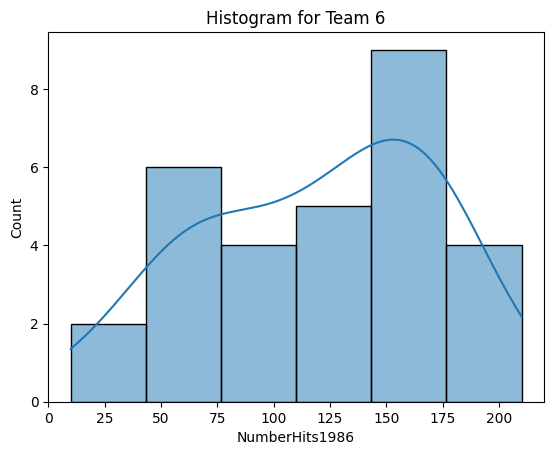

Shapiro-Wilk test for team 15: p-value = 0.16158798087963314


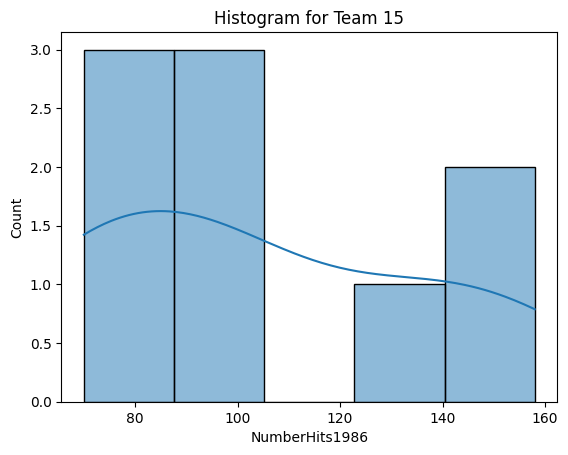

Shapiro-Wilk test for team 5: p-value = 0.026806720857600184


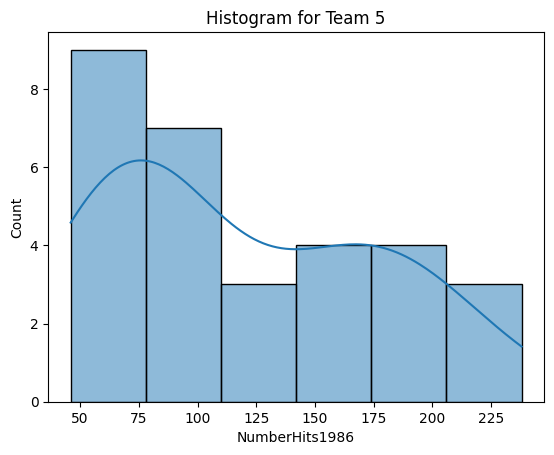

Shapiro-Wilk test for team 12: p-value = 0.4370393426230376


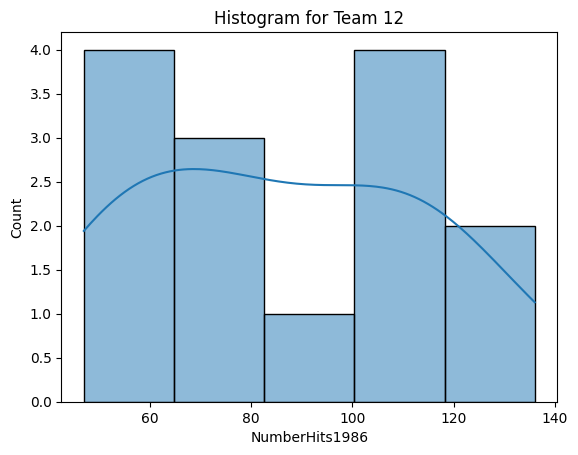

Shapiro-Wilk test for team 8: p-value = 0.6914088050825076


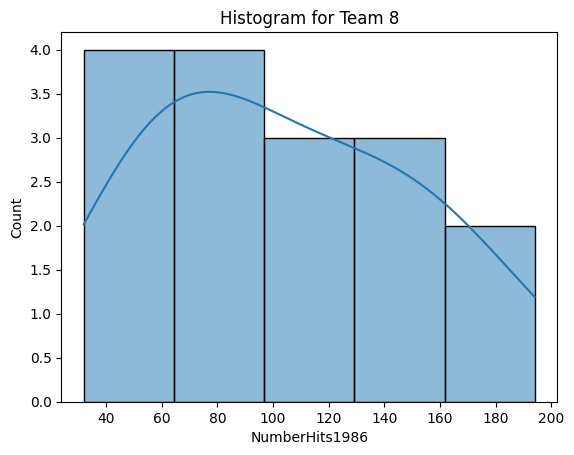

Shapiro-Wilk test for team 18: p-value = 0.14688654036778334


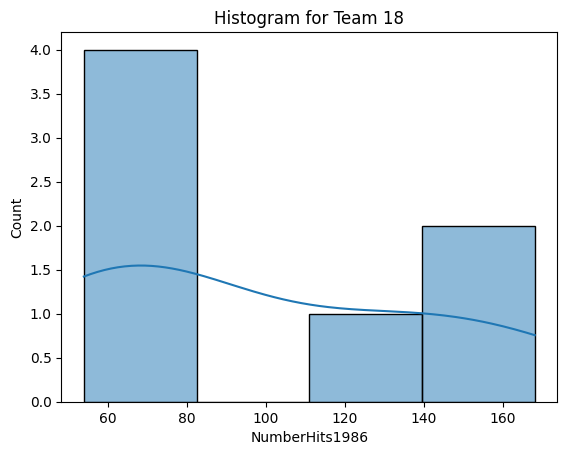

Shapiro-Wilk test for team 7: p-value = 0.9583688181567234


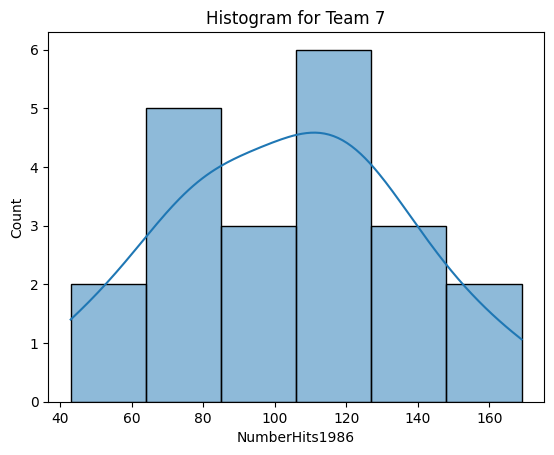

Shapiro-Wilk test for team 17: p-value = 0.287805836577851


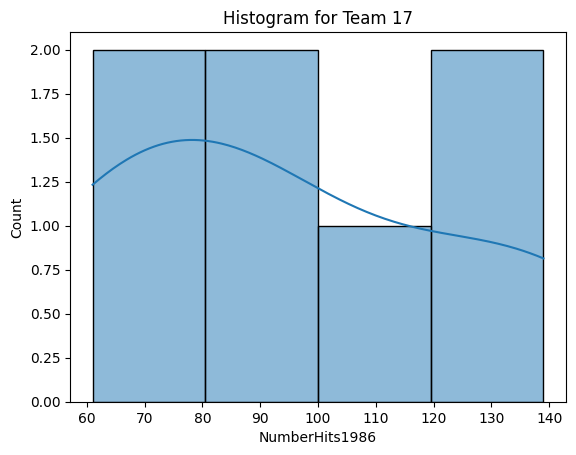

Shapiro-Wilk test for team 16: p-value = 0.7097862428557574


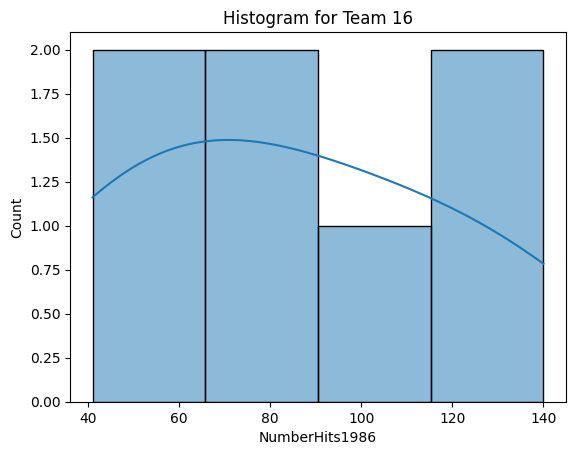

Shapiro-Wilk test for team 20: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


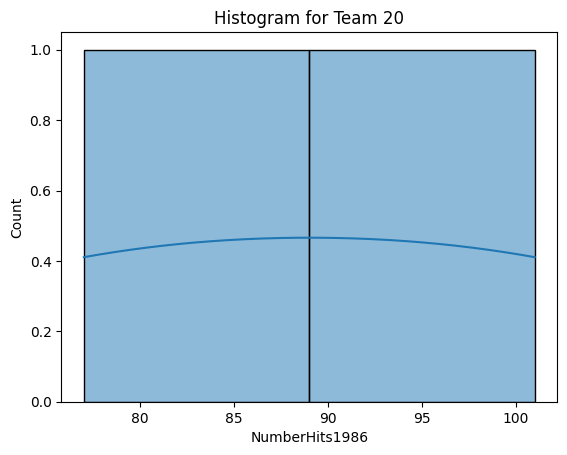

Shapiro-Wilk test for team 24: p-value = nan


/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


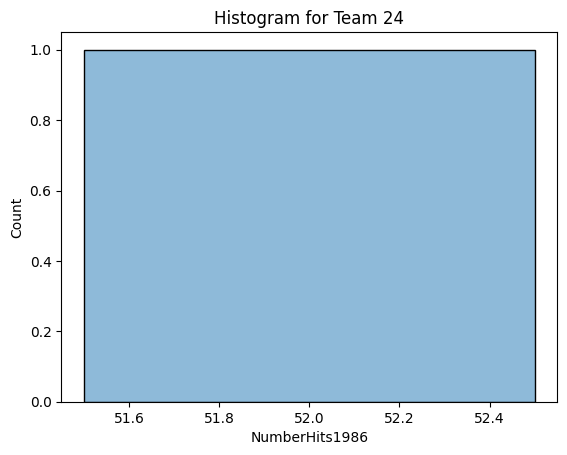

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team 23: p-value = nan


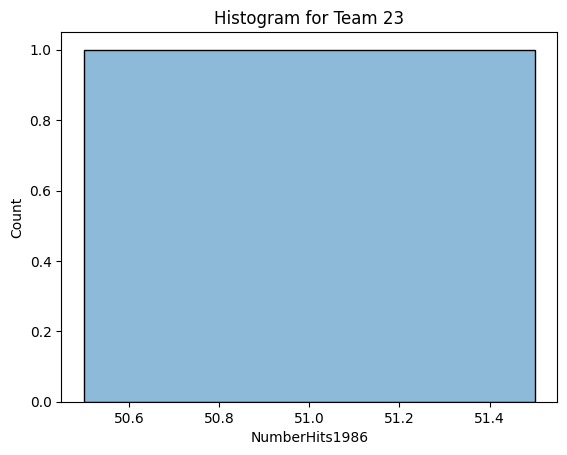

/var/folders/_g/pnkjprqj7z3d7wwtd6jwl2fc0000gn/T/ipykernel_8643/1170624647.py:8: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p_value = stats.shapiro(group_scores)


Shapiro-Wilk test for team 19: p-value = nan


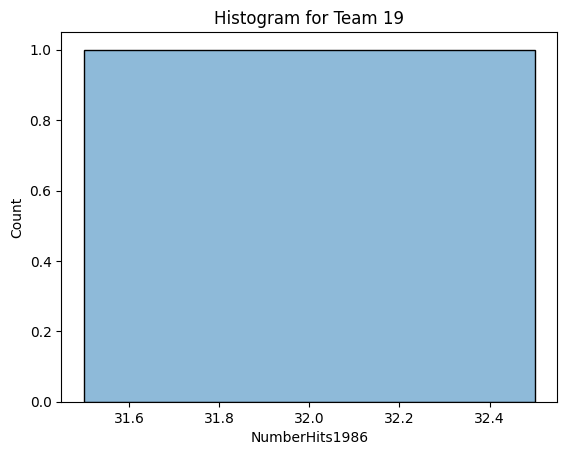

Levene's Test: p-value = 0.23220127567460738
ANOVA Test: p-value = 0.05948666614576115
*************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

In [85]:
import scipy.stats as stats

for cat in external_factors_columns:
  print(hitters[cat].value_counts())
  teams = hitters[cat].unique()
  for team in teams:
      group_scores = hitters[hitters[cat] == team]['NumberHits1986']
      stat, p_value = stats.shapiro(group_scores)
      print(f"Shapiro-Wilk test for team {team}: p-value = {p_value}")
      sns.histplot(group_scores, kde=True).set_title(f"Histogram for Team {team}")
      plt.show()

  # Check Homogeneity of Variance
  stat, p_value = stats.levene(*[hitters[hitters[cat] == team]['NumberHits1986'] for team in teams])
  print(f"Levene's Test: p-value = {p_value}")

  # Perform One-Way ANOVA if assumptions are met
  stat, p_value = stats.f_oneway(*[hitters[hitters[cat] == team]['NumberHits1986'] for team in teams])
  print(f"ANOVA Test: p-value = {p_value}")
  print("*"*200000)